Notes
- The same library was sequenced twice on the AVITI. The first, on 2023-12-04, was largely a "failed" run with extremely low read count and poor read quality scores. Hence, the entire library pool was re-sequenced on 2023-12-08.
- Goals
  1. Barcode count distributions
  2. Ligation efficiency - relative amounts of Oligo+Y vs. Oligo+R1+Y vs. ... vs. Oligo+R1+R2+R3+Y

# Setup

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext watermark

In [2]:
# Python Standard Library modules
# import collections
import gzip
import itertools
# import json
import os
import re
import subprocess
import sys

# Basic SciPy packages
import numpy as np
import scipy
import pandas as pd

# Visualization packages
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so
import plotly.graph_objects as go
import plotly.express as px
# import holoviews as hv
# from holoviews import opts
# hv.extension('bokeh')
from tqdm.auto import tqdm

# Custom modules
sys.path.append('../scripts')
import string_distances
import helpers
# import plot_features
import parse_barcodes

In [3]:
%watermark
%watermark --conda
%watermark --iversions

Last updated: 2024-01-11T20:17:38.370448-08:00

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 8.14.0

Compiler    : GCC 12.3.0
OS          : Linux
Release     : 3.10.0-1160.53.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

conda environment: py3

sys       : 3.10.12 | packaged by conda-forge | (main, Jun 23 2023, 22:40:32) [GCC 12.3.0]
re        : 2.2.1
plotly    : 5.15.0
scipy     : 1.11.1
matplotlib: 3.7.2
seaborn   : 0.12.2
numpy     : 1.23.5
pandas    : 2.0.2



In [4]:
%%bash
splitcode --version

splitcode, version 0.29.1


In [5]:
DIR_PROJECT = '/central/groups/guttman/btyeh/scBarcode'
DIR_DATA = os.path.join(DIR_PROJECT, 'data', '20231208')
DIR_AUX = os.path.join(DIR_PROJECT, 'data_aux', '20231208')
DIR_PROC = os.path.join(DIR_PROJECT, 'data_proc', '20231208')
DIR_RESULTS = os.path.join(DIR_PROJECT, 'results', '20231208')
# DIR_DATA_1 = os.path.join(DIR_PROJECT, 'data', '20231204')
# DIR_AUX = os.path.join(DIR_PROJECT, 'data_aux', '20231204')
# DIR_PROC_1 = os.path.join(DIR_PROJECT, 'data_proc', '20231204')
# DIR_RESULTS_1 = os.path.join(DIR_PROJECT, 'results', '20231204')

os.makedirs(DIR_AUX, exist_ok=True)
os.makedirs(DIR_PROC, exist_ok=True)
os.makedirs(DIR_RESULTS, exist_ok=True)

# Constants and Helpers

In [6]:
ROUNDS = ['R1', 'R2', 'R3', 'Y']
STRUCTURES = ['oligo+Y', 'oligo+R1+Y', 'oligo+R1+R2+Y', 'oligo+R1+R2+R3+Y']

# Data

- [Enhanced Sample Sheet](https://docs.google.com/spreadsheets/d/1mykwPx2yhmo0AwmW5-jT6n4OxP4uvRGfa7T5gqjKeH8/)
- [Library sheet](https://docs.google.com/spreadsheets/d/1NeARoDSZU0c5SxCTj2-0UxUu3JVUmXzFHPPD1xkGmKM/)
- [Benchling notebook: 2023-11-29 Single Cell Barcode Troubleshooting, v4 (terminal tag vs. EDTA quench)](https://benchling.com/s/etr-3bKIM8CScL814XrVEUBG)

In [7]:
path_df_data = os.path.join(DIR_RESULTS, 'sample_info.csv')
if not os.path.exists(path_df_data):
    regex_fastq_files = re.compile((
        r'(?P<filename>scBarcode-(?P<basename>(?P<quench>EDTA|NY)_(?P<sample>.*))_R(?P<read>1|2).fastq.gz)'))
    
    files_fastq = sorted([file for file in os.listdir(DIR_DATA) if file.endswith('.fastq.gz')])
    df_data = pd.DataFrame([
        regex_fastq_files.match(file).groupdict() for file in files_fastq]) \
        .astype(dict(read=int))
    
    popen_counts = dict()
    for sample, group in df_data.groupby('sample'):
        filename = group.loc[group['read'] == 1, 'filename'].item()
        cmd = "unpigz -c {path_fastq_raw} | wc -l | awk '{{print $1 / 4}}'".format(path_fastq_raw=os.path.join(DIR_DATA, filename))
        popen_counts[sample] = subprocess.Popen(cmd, shell=True, stdin=subprocess.PIPE, stdout=subprocess.PIPE)
    
    df_data['n_reads'] = int(0)
    for sample, popen in popen_counts.items():
        count, err = popen.communicate()
        assert err is None and popen.returncode == 0
        df_data.loc[df_data['sample'] == sample, 'n_reads'] = int(count.decode().strip())
    
    path_library_info = os.path.join(DIR_DATA, '2023-11-30 Amplification and Sequencing of Flow Singlets - Gel Cut.csv')
    df_library_info = (
        pd.read_csv(path_library_info)
        .pipe(lambda df: (
            df.assign(basename=df['Sample'].str.replace('scBarcode-', ''))
            .drop(columns=[c for c in df.columns if c.startswith('Unnamed')])
            .loc[~df['Sample'].isna() & df['To Pool']]
            .rename(columns={'Complexity': 'Complexity (Tapestation)'})
            .astype({'Complexity (Tapestation)': int})
        ))
    )
    
    # from the library sheet, linked above
    df_data = (
        df_data
        .merge(df_library_info[['basename', 'Complexity (Tapestation)']], how='left')
        .sort_values(['basename', 'read'])
        .reset_index(drop=True)
    )
    df_data.to_csv(path_df_data, index=False)
else:
    df_data = pd.read_csv(path_df_data, index_col=False)

In [8]:
print('Total number of paired reads:', df_data['n_reads'].sum() // 2)
display(df_data)

Total number of paired reads: 24104736


,filename,basename,quench,sample,read,n_reads,Complexity (Tapestation)
0,scBarcode-EDTA_A2_R1.fastq.gz,EDTA_A2,EDTA,A2,1,135884,590000
1,scBarcode-EDTA_A2_R2.fastq.gz,EDTA_A2,EDTA,A2,2,135884,590000
2,scBarcode-EDTA_A3_R1.fastq.gz,EDTA_A3,EDTA,A3,1,1257782,3570000
3,scBarcode-EDTA_A3_R2.fastq.gz,EDTA_A3,EDTA,A3,2,1257782,3570000
4,scBarcode-EDTA_B2_R1.fastq.gz,EDTA_B2,EDTA,B2,1,1104986,3770000
5,scBarcode-EDTA_B2_R2.fastq.gz,EDTA_B2,EDTA,B2,2,1104986,3770000
6,scBarcode-EDTA_C3_R1.fastq.gz,EDTA_C3,EDTA,C3,1,513192,1870000
7,scBarcode-EDTA_C3_R2.fastq.gz,EDTA_C3,EDTA,C3,2,513192,1870000
8,scBarcode-EDTA_D2_R1.fastq.gz,EDTA_D2,EDTA,D2,1,1730567,4830000
9,scBarcode-EDTA_D2_R2.fastq.gz,EDTA_D2,EDTA,D2,2,1730567,4830000


## Check sequencing depth

Mostly linear relationship between Tapestation-estimated library complexity and number of reads obtained. Only 2 samples from the terminal quench strategy (`C4_lt-220bp` and `D4_lt-220bp`) are moderately undersampled.

In [9]:
fig = px.scatter(
    df_data,
    x='Complexity (Tapestation)',
    y='n_reads',
    color='sample',
    facet_col='quench'
)

# set height to ensure that all samples are shown in legend without need for scrolling
fig.update_layout(height=450, margin=dict(l=10, r=10, b=10, t=20))
fig.show()

# Alternative non-interactive plot using seaborn
# g = sns.relplot(
#     kind='scatter',
#     data=df_data.loc[df_data['read'] == 1],
#     x='Complexity (Tapestation)',
#     y='n_reads',
#     hue='sample',
#     col='quench',
#     facet_kws=dict(sharex=False, sharey=False)
# )

# FastQC

Expectations
- Read 1: good sequence diversity due to UMIs on the oligo
- Read 2: near total duplication from each sample, since all barcodes from the same nucleus should have the same R1, R2, R3, and NYLigOdd tags

In [10]:
%%bash -s {DIR_DATA} {DIR_PROC}
DIR_DATA="$1"
DIR_PROC="$2"
source ~/.bashrc
DIR_FASTQC_OUT="$DIR_PROC/fastqc"
if [ ! -d "$DIR_FASTQC_OUT" ]; then
    mkdir "$DIR_PROC/fastqc"
    cd "$DIR_DATA"
    conda activate chipdip
    fastqc *.fastq.gz -t 20 -q -o "$DIR_FASTQC_OUT"
fi

# Check read structure

Expected read structures (see also Benchling DNA sequence: [Oligo (PC50_12merUMI) + R1-R3 + NYLigOdd PCR Product (2Puni + 2Pbc)](https://benchling.com/s/seq-uec4dPutBQPpgn6aNbXV))

| Component                                 | Length | R1 coordinates | R2 coordinates |
| ----------------------------------------- | ------ | -------------- | -------------- |
| 2Puni adapter, remainder                  | 49     | n/a            | 118:167        |
| 2Puni adapter, continued                  | 10     | n/a            | 108:118        |
| 2Puni adapter, Illumina universal adapter | 11     | n/a            | 97-98:108-109  |
| Oligo UMI                                 | 12     | 0:12           | 85-86:97-98    |
| LigEven / Even overhang                   | 7      | 12:19          | 78-79:85-86    |
| R1 unique sequence                        | 16     | 19:35          | 62-63:78-79    |
| LigR1 / R1 overhang                       | 7      | 35:42          | 55-56:62-63    |
| R2 unique sequence                        | 16     | 42:58          | 39-40:55-56    |
| LigR2 / R2 overhang                       | 7      | 58:65          | 32-33:39-40    |
| R3 unique sequence                        | 16     | 65:81          | 16-17:32-33    |
| LigR3 / R3 overhang                       | 7      | 81:88          | 9-10:16-17     |
| NYLigOddStg (rows A-B) unique sequence    | 9-10   | 88:97-98       | 0:9-10         |
| 2Pbc adapter, Illumina universal adapter  | 11     | 97-98:108-109  | n/a            |

Note: see the splitcode config file for the subsequences of the 2Puni and 2Pbc adapters that are identified.

This sequencing run was acquired with a read 1 length of 120 bp and read 2 length of 180 bp --> can use up to 22 bp for the Illumina adapter for read 1, and all of the adapter for read 2.

## Check terminal tags used

Used wells A1-B12 from a really old NYLigOdd plate --> verify that the wells are in row-major order as expected.

Splitcode config summary: only detect terminal tags associated with a preceeding LigEven/LigR1/LigR2/LigR3 overhang and a following Illumina sequencing adapter sequence.
- I do not allow any errors.
  - This is only an initial QC step, so I do not care to detect the terminal tag in all reads.
  - My initial config file `splitcode_config-Y_r1.tsv` led to extremely poor (<50%) tag identification for samples NY_A4_gt-220bp, EDTA_C3, and NY_H4_all.
    - Ligation overhangs: 1 edit distance
      - <span style="color:red">Somehow switching to 1 hamming distance improves identification for some samples</span>
    - Terminal tags: [maximal hamming distances allowed](https://docs.google.com/spreadsheets/d/1ufkFUfiefmgEtHqwCRk77iJ_fARnvLlxe63xoEo7peU) = 2 for terminal tags with 9 or 10 bp of unique sequence, 1 for terminal tags with 11 bp of unique sequence, and 0 for terminal tags with 12 bp of unique sequence)
    - Illumina adaptor: 2 edit distance
      - <span style="color:red">Changing this to 0 does not significantly change identification, even though presumably allowing edits here could lead to more false-positives than reducing edit distance allowed for the ligation overhangs. </span> From [splitcode documentation](https://splitcode.readthedocs.io/en/latest/user_guide_tags.html#error-distances-tolerance):
        > Be careful when using indels, e.g. the matched sequence might include extra bps at the beginning since those might technically count as “insertions” (since splitcode proceeds from the beginning to the end of a read to find matches).

Conclusions
- All the mode terminal tags are within indices 1-24.
- All EDTA-quenched samples have a mode terminal tag that is at least 215x more common than the 2nd most common terminal tag.
- All EDTA-quenched samples and >220 bp gel-cut NY-quench samples have a mode terminal tag with a `LigR3` overhang.

In [224]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-Y_r1_strict.tsv')

In [12]:
%%bash -s '{DIR_DATA}' '{DIR_PROC}' '{path_config}'
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

echo "Using config $PATH_CONFIG"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_counts="${DIR_PROC}/terminal_tag_counts-${SAMPLE}.tsv"

    if [ ! -f "$path_counts" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --no-outb -t 8 \
            --mapping=/dev/stdout --output=/dev/null \
            "$path_R1" |
            cut -f 2,3 |
            sed -E -e 's/.*(Lig[^,]+,NY[^,]+)$/\1/' |
            awk '{arr[$1]+=$2} END {for (key in arr) printf("%s\t%s\n", key, arr[key])}' |
            sort -k2nr,2 -k1,1 > "$path_counts"
    fi
    
    # output = tab-delimited file with 2 columns, sorted in descending order by column 2:
    # - column 1 = terminal tag, including its overhang (e.g., LigR3,NYTopStg_4)
    # - column 2 = read count
done

Using config /central/groups/guttman/btyeh/scBarcode/data_aux/20231208/splitcode_config-Y_r1_strict.tsv


In [225]:
df_terminal_tags_r1 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_PROC, f'terminal_tag_counts-{sample}_R1.tsv')
    df_terminal_tags_r1.append(
        pd.read_csv(path_analysis, sep='\t', header=None, names=['tag', 'count']) \
            .assign(sample=sample)
    )
df_terminal_tags_r1 = pd.concat(df_terminal_tags_r1, axis=0, ignore_index=True)
df_terminal_tags_r1['Y'] = df_terminal_tags_r1['tag'].str.extract('NYStgTop_(\d+)').astype(int)
df_terminal_tags_r1['overhang'] = df_terminal_tags_r1['tag'].str.extract('(Lig[^,]+)')

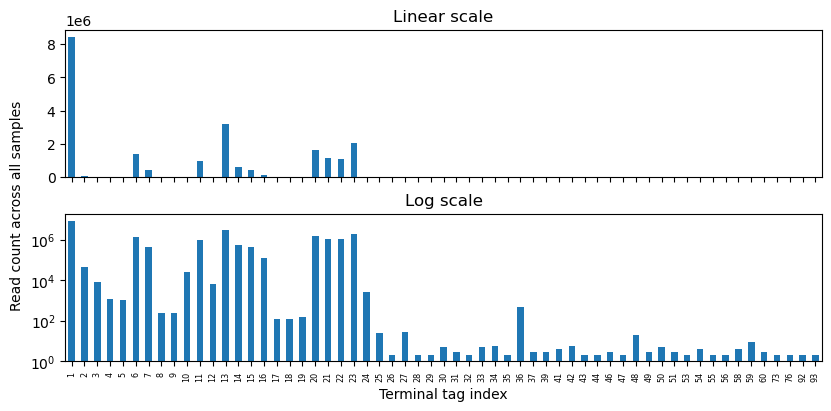

In [14]:
fig, axs = plt.subplots(2, 1, figsize=(8, 4), sharex=True, sharey=False, constrained_layout=True)
df_terminal_tags_r1.groupby('Y')['count'].sum().plot(kind='bar', log=False, ax=axs[0])
df_terminal_tags_r1.groupby('Y')['count'].sum().plot(kind='bar', log=True, ax=axs[1])
fig.text(-0.02, 0.5, 'Read count across all samples', va='center', rotation='vertical')
axs[0].set(title='Linear scale')
axs[1].set(title='Log scale', xlabel='Terminal tag index')
axs[1].xaxis.set_tick_params(labelsize='xx-small')

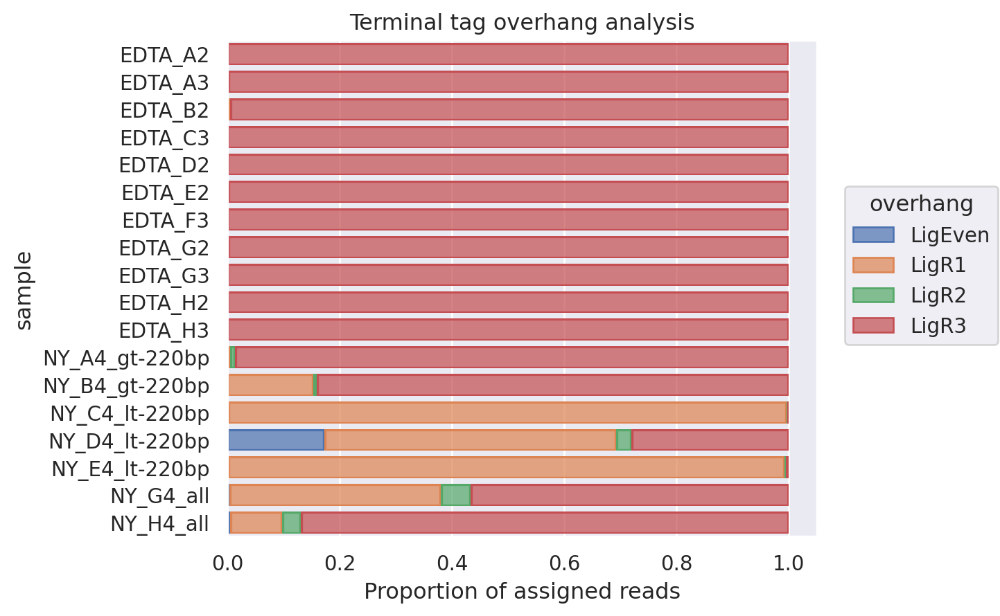

In [16]:
g = (
    so.Plot(
        (
            df_terminal_tags_r1
            .groupby(['sample', 'overhang'])['count'].sum()
            .reset_index()
            .groupby('sample', group_keys=False)
            .apply(lambda df: df.assign(proportion=df['count']/df['count'].sum()))
        ),
        y='sample',
        x='proportion',
        color='overhang')
    .add(so.Bar(), so.Stack())
    .label(
        x='Proportion of assigned reads',
        title='Terminal tag overhang analysis',
    )
)
g.save(
    os.path.join(DIR_RESULTS, 'terminal tag overhang distribution.png'),
    dpi=300,
    bbox_inches='tight'
)

In [228]:
df_terminal_tags_r1_summary = (
    df_terminal_tags_r1
    .groupby('sample')['count'].sum()
    .to_frame().reset_index()
    .merge(df_data[['basename', 'n_reads']].drop_duplicates().rename(columns=dict(basename='sample')))
    .pipe(lambda df: df.assign(proportion_counted=df['count']/df['n_reads']))
)

# most common terminal tag (combination of overhang + unique sequence)
df_terminal_tags_r1_summary = df_terminal_tags_r1_summary.merge(
    (
        df_terminal_tags_r1
        .groupby('sample', group_keys=True)
        .apply(lambda group: (
            group
            .sort_values('count', ascending=False)
            .head(1)[['sample', 'Y', 'overhang']]
        )).reset_index(drop=True)
        .rename(columns={'Y': 'mode_Y-tag_Y', 'overhang': 'mode_Y-tag_overhang'})
    ),
    how='inner'
)

# ratio of count of most common terminal tag to next most common terminal tag
df_terminal_tags_r1_summary = df_terminal_tags_r1_summary.merge(
    (
        df_terminal_tags_r1
        .sort_values(['sample', 'count'], ascending=False)
        .groupby('sample')['count']
        .agg(**{'ratio_mode_to_next': lambda x: x.iloc[0]/x.iloc[1], 'mode_Y-tag_count': 'max'})
        .reset_index()
    ),
    how='inner'
)

In [229]:
df_terminal_tags_r1_summary

,sample,count,n_reads,proportion_counted,mode_Y-tag_Y,mode_Y-tag_overhang,ratio_mode_to_next,mode_Y-tag_count
0,EDTA_A2,125081,135884,0.920498,16,LigR3,897.244604,124717
1,EDTA_A3,1102998,1257782,0.876939,22,LigR3,1691.955453,1101463
2,EDTA_B2,979206,1104986,0.886171,11,LigR3,215.842759,973235
3,EDTA_C3,466056,513192,0.908151,23,LigR3,614.005284,464802
4,EDTA_D2,1534668,1730567,0.886801,20,LigR3,7907.850515,1534123
5,EDTA_E2,1123790,1232710,0.911642,21,LigR3,352.817952,1116316
6,EDTA_F3,443760,495288,0.895964,15,LigR3,313.429483,442249
7,EDTA_G2,586934,673366,0.871642,14,LigR3,602.254377,584789
8,EDTA_G3,517762,585039,0.885004,23,LigR3,3193.969136,517423
9,EDTA_H2,664501,730435,0.909733,13,LigR3,752.560726,663006


# Count barcodes

1. Add barcode and UMI to read name
   - For config file with separate overhangs: `@read::[LigEven][R1Top_<R1>][LigR1][R2Top_<R2>][LigR2][R3Top_<R3>][LigR3][NYTop_<Y>][Illumina][2Pbc] RX:Z:<umi>`
   - For config file with in-tag overhangs: `@read::[R1Top_<R1>][R2Top_<R2>][R3Top_<R3>][NYTop_<Y>][Illumina][2Pbc] RX:Z:<umi>`
2. Calculate barcode counts

## Tag identification by splitcode

In [17]:
splitcode_configs = (
    'oligo+R1+R2+R3+Y_overhangs-in-tag_r1',
    'oligo+R1+R2+R3+Y_overhangs-separate_r1',
    'oligo+R1+R2+Y_overhangs-in-tag_r1',
    'oligo+R1+R2+Y_overhangs-separate_r1',
    'oligo+R1+Y_overhangs-in-tag_r1',
    'oligo+R1+Y_overhangs-separate_r1',
    'oligo+Y_overhangs-in-tag_r1',
    'oligo+Y_overhangs-separate_r1',
    'all-expected_overhangs-in-tag_r1',
    'all-expected_overhangs-separate_r1'
)

In [18]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_AUX} {DIR_PROJECT}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_AUX="$3"
DIR_PROJECT="$4"

declare -a SPLITCODE_CONFIGS=(
    'oligo+R1+R2+R3+Y_overhangs-in-tag_r1'
    'oligo+R1+R2+R3+Y_overhangs-separate_r1'
    'oligo+R1+R2+Y_overhangs-in-tag_r1'
    'oligo+R1+R2+Y_overhangs-separate_r1'
    'oligo+R1+Y_overhangs-in-tag_r1'
    'oligo+R1+Y_overhangs-separate_r1'
    'oligo+Y_overhangs-in-tag_r1'
    'oligo+Y_overhangs-separate_r1'
    'all-expected_overhangs-in-tag_r1'
    'all-expected_overhangs-separate_r1'
)

PATH_SBATCH="$DIR_PROJECT/scripts/splitcode.sbatch"

for config in "${SPLITCODE_CONFIGS[@]}"; do
    PATH_CONFIG="$DIR_AUX/splitcode_config-${config}.tsv"

    for PATH_R1 in "$DIR_DATA"/*R1.fastq.gz; do
        SAMPLE="$(echo "$PATH_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1' | sed -E -e 's/_R1$//')"
        PATH_MAPPING="$DIR_PROC/mapping-${config}-${SAMPLE}.tsv"
        PATH_SUMMARY="$DIR_PROC/summary-${config}-${SAMPLE}.json"
        PATH_OUTPUT="$DIR_PROC/read_barcodes-${config}-${SAMPLE}.txt.gz"

        if [ ! -f "$PATH_OUTPUT" ]; then

            # submit as SLURM jobs
            PATH_SBATCH_ERROR="$DIR_PROC/sbatch-${config}-${SAMPLE}.err"
            PATH_SBATCH_OUT="$DIR_PROC/sbatch-${config}-${SAMPLE}.out"
            sbatch --error="$PATH_SBATCH_ERROR" --out="$PATH_SBATCH_OUT" \
                "$PATH_SBATCH" \
                "$PATH_CONFIG" "$PATH_MAPPING" "$PATH_SUMMARY" "$PATH_OUTPUT" "$PATH_R1"

            # run locally
            # splitcode -c "$PATH_CONFIG" \
            #     --nFastqs=1 --assign --mod-names --x-names --no-x-out --no-outb --out-fasta -t 8 \
            #     --mapping="$PATH_MAPPING" --summary="$PATH_SUMMARY" --output=/dev/stdout \
            #     "$PATH_R1" |
            # awk '$1 ~ /^>/' |
            # pigz -p 8 > "$PATH_OUTPUT"
        fi
    done
done

### UMI extraction validation

- Individual config files for individual expected structure: All assigned reads are associated with 12 bp UMIs. A tiny fraction of such UMIs contain `N`s.
- integrated config files for all expected structures: A tiny fraction of reads are not associated with any UMIs. All associated UMIs are of length 12, and a tiny fraction of them contain `N`s.

Note that because many different configs were used, the number of assigned reads is more than the number of actual reads.

#### Assigned reads from individual config files for individual expected structures

In [119]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of assigned reads from config files for individual expected structures:'
unpigz -c "$DIR_PROC"/read_barcodes-oligo*_overhangs-*_r1*.txt.gz | wc -l

Number of assigned reads from config files for individual expected structures:
44839368


In [123]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of UMIs by length:'
unpigz -c "$DIR_PROC"/read_barcodes-oligo*_overhangs-*_r1*.txt.gz | \
   grep -o -E -e 'RX:Z:[ATCGN]*' | sed -E -e 's/RX:Z://' | \
   awk '{print length}' | sort -n | uniq -c

Number of UMIs by length:
44839368 12


In [124]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of UMIs by containing Ns:'
unpigz -c "$DIR_PROC"/read_barcodes-oligo*_overhangs-*_r1*.txt.gz | \
   grep -E -e 'RX:Z:[ATCGN]*N[ATCG]*' | wc -l

Number of UMIs by containing Ns:
18063


#### Assigned reads from integrated config files for all expected structures

In [125]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of assigned reads from config files for individual expected structures:'
unpigz -c "$DIR_PROC"/read_barcodes-all-expected*_overhangs-*_r1*.txt.gz | wc -l

Number of assigned reads from config files for individual expected structures:
44853291


In [126]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of UMIs by length:'
unpigz -c "$DIR_PROC"/read_barcodes-all-expected*_overhangs-*_r1*.txt.gz | \
   grep -o -E -e 'RX:Z:[ATCGN]*' | sed -E -e 's/RX:Z://' | \
   awk '{print length}' | sort -n | uniq -c

Number of UMIs by length:
44853133 12


In [127]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
echo 'Number of UMIs by containing Ns:'
unpigz -c "$DIR_PROC"/read_barcodes-all-expected*_overhangs-*_r1*.txt.gz | \
   grep -E -e 'RX:Z:[ATCGN]*N[ATCG]*' | wc -l

Number of UMIs by containing Ns:
18080


## Parse barcode counts to DataFrames

- `df_umi_counts`: closest representation of raw data; counts per [barcode + UMI]
  - format: n/a
  - `id_vars`: `sample`, `config`, `R1`, `R2`, `R3`, `umi`
  - `value_vars`: `count`
- `df_barcode_counts`: counts per barcode
  - format: wide
  - `id_vars`: `sample`, `config`, `R1`, `R2`, `R3`
  - `value_vars`: `count`, `count_dedup`
- `df_tag_counts`: deduplicated counts per tag
  - format: long
  - `id_vars`: `sample`, `config`, `round`, `tag`, `deduplication`
  - `value_vars`: `count` (deduplicated)

In [40]:
path_umi_validation = os.path.join(DIR_RESULTS, 'umi_validation.csv')
path_structure_proportion = os.path.join(DIR_RESULTS, 'barcode_structure_proportion.csv')
path_tag_counts = os.path.join(DIR_RESULTS, 'tag_counts.csv')
paths_barcode_counts = [os.path.join(DIR_RESULTS, f'barcode_counts-{sample}.csv') for sample in df_data['basename'].unique()]

In [44]:
reprocess = not all(os.path.exists(path) for path in [path_umi_validation, path_structure_proportion, path_tag_counts] + paths_barcode_counts)
print('reprocess:', reprocess)

reprocess: True


In [19]:
regex_barcode_overhangs_separate = re.compile((
    r'\[LigEven\]'
    r'('
      r'(\[R1Top_(?P<R1>\d+)\]\[LigR1\]'
        r'(\[R2Top_(?P<R2>\d+)\]\[LigR2\]'
          r'(\[R3Top_(?P<R3>\d+)\]\[LigR3\])?'
        r')?'
      r')?'
    r')?'
    r'\[NYTop_(?P<Y>\d+)\]'
    r'\[Illumina\]\[2Pbc\]'
    r'\s+'
    r'RX:Z:(?P<umi>[ACGNT]*)'
))
regex_barcode_overhangs_in_tag = re.compile((
    r'('
      r'(\[R1Top_(?P<R1>\d+)\]'
        r'(\[R2Top_(?P<R2>\d+)\]'
          r'(\[R3Top_(?P<R3>\d+)\])?'
        r')?'
      r')?'
    r')?'
    r'\[NYTop_(?P<Y>\d+)\]'
    r'\[Illumina\]\[2Pbc\]'
    r'\s+'
    r'RX:Z:(?P<umi>[ACGNT]*)'
))
overhang_to_regex = {
    'separate': regex_barcode_overhangs_separate,
    'in-tag': regex_barcode_overhangs_in_tag
}

DTYPE_SAMPLE = pd.api.types.CategoricalDtype(categories=list(df_data['basename'].unique()))
DTYPE_CONFIG = pd.api.types.CategoricalDtype(
    categories=list(splitcode_configs) + \
               [config.replace('all-expected', 'combined-expected') for config in splitcode_configs
                if config.startswith('all-expected')]
)

def count_barcodes(config, sample, regex):
    '''
    From the read_barcodes file generatedy from a given sample and splitcode config,
    count the barcodes and UMIs, and tabulate in pandas DataFrames.

    Args
    - config: str
        Splitcode config name
    - sample: str
        Sample name
    - regex: re.Pattern
        Regular expression pattern for barcode. Should contain named capture groups.
    
    Returns
    - df_barcode_counts: pandas.DataFrame
      - Only includes reads associated with 12 bp UMIs containing no Ns
      - Columns
        - R1, R2, R3, Y: np.uint8
        - count: np.int64
        - count_dedup: np.int64
        - sample: DTYPE_SAMPLE
        - config: DTYPE_CONFIG
    - df_umi_counts: pandas.DataFrame
      - R1, R2, R3, Y: np.uint8
      - umi: str
      - count: np.int64
      - sample: DTYPE_SAMPLE
      - config: DTYPE_CONFIG
    - n_unmatched: int
        Number of reads whose barcodes did not match the provided regex.
    '''
    path_barcodes = os.path.join(DIR_PROC, f'read_barcodes-{config}-{sample}.txt.gz')
    with gzip.open(path_barcodes, 'rt') as f:
        df_umi_counts, n_unmatched, unmatched = parse_barcodes.barcodes_to_df(f, regex)
    if len(df_umi_counts) > 0:
        df_umi_counts = (
            df_umi_counts
            .fillna(0)
            .astype(dict(R1=np.uint8, R2=np.uint8, R3=np.uint8, Y=np.uint8))
            .groupby(list(df_umi_counts.columns), observed=True).size()
            .reset_index().rename(columns={0: 'count'})
        )
    else:
        df_umi_counts = pd.DataFrame([], columns=ROUNDS + ['umi', 'count'])
    df_barcode_counts = (
        df_umi_counts
        .loc[(~df_umi_counts['umi'].str.contains('N')) & (df_umi_counts['umi'].map(len) == 12)]
        .groupby(ROUNDS, observed=True)["count"]
        .agg(["count", "sum"])
        .reset_index()
        .rename(columns={"count": "count_dedup", "sum": "count"})
    )
    df_barcode_counts['sample'] = pd.Series([sample] * len(df_barcode_counts), dtype=DTYPE_SAMPLE)
    df_barcode_counts['config'] = pd.Series([config] * len(df_barcode_counts), dtype=DTYPE_CONFIG)
    df_umi_counts['sample'] = pd.Series([sample] * len(df_umi_counts), dtype=DTYPE_SAMPLE)
    df_umi_counts['config'] = pd.Series([config] * len(df_umi_counts), dtype=DTYPE_CONFIG)
    return df_barcode_counts, df_umi_counts, n_unmatched, unmatched

In [20]:
def umi_df_to_validation(df, n_unmatched=None):
    '''
    Compute summary validation metrics from a UMI counts table (e.g., df_umi_counts).

    Args
    - df: pandas.DataFrame
        Columns must include 'umi' and 'count'. In this notebook, usually df_umi_counts.
    - n_unmatched: int or None
        Number of unmatched reads

    Returns: pandas.DataFrame
    - metric: str
        'len(UMI)>12', 'len(UMI)<12', 'N in UMI', or 'n_unmatched'
    - count_type: str
        'raw' or 'dedup'
    - count: int or None
    '''
    entries = []

    # reads with UMIs of length != 12
    length = df['umi'].map(len)
    mask_long = length > 12
    mask_short = length < 12
    entries.append(dict(metric='len(UMI)>12', count_type='raw', count=df.loc[mask_long, 'count'].sum()))
    entries.append(dict(metric='len(UMI)>12', count_type='dedup', count=mask_long.sum()))
    entries.append(dict(metric='len(UMI)<12', count_type='raw', count=df.loc[mask_short, 'count'].sum()))
    entries.append(dict(metric='len(UMI)<12', count_type='dedup', count=mask_short.sum()))

    # reads with UMIs containing Ns
    mask_ns = df['umi'].str.contains('N')
    entries.append(dict(metric='N in UMI', count_type='raw', count=df.loc[mask_ns, 'count'].sum()))
    entries.append(dict(metric='N in UMI', count_type='dedup', count=mask_ns.sum()))

    # reads unmatched
    entries.append(dict(metric='n_unmatched', count_type='raw', count=n_unmatched))
    return pd.DataFrame(entries)

def barcode_counts_to_structures(df, null=0, total=None):
    '''
    Compute counts of each structure from a DataFrame of barcode counts.
    
    Args
    - df: pandas.DataFrame
        Columns must include 'R1', 'R2', 'R3', 'count_dedup', 'count'
    - null: <variable>
        Value in df that indicates a missing tag
    - total: int or None
        Total number of raw reads.

    Returns: pandas.DataFrame
    - structure: 'oligo+Y', 'oligo+R1+Y', 'oligo+R1+R2+Y', or 'oligo+R1+R2+R3+Y'
    - count_type: 'raw', 'assigned', 'dedup'
      - raw = assigned reads matching the structure / total reads (provided by the `total` argument)
      - assigned = assigned reads matching the structure / total assigned reads
      - dedup = assigned, UMI-deduplicated reads matching the structure / total assigned, UMI-deduplicated reads
    - count: int
    - prop: float
    '''
    entries = []
    masks = {}
    masks['oligo+Y'] = (df['R1'] == null)
    masks['oligo+R1+Y'] = (df['R2'] == null) & ~masks['oligo+Y']
    masks['oligo+R1+R2+Y'] = (df['R3'] == null) & ~(masks['oligo+Y'] | masks['oligo+R1+Y'])
    masks['oligo+R1+R2+R3+Y'] = (df['R3'] != null)
    for structure, mask in masks.items():
        entries.append(dict(structure=structure, count_type='assigned', count=df.loc[mask, 'count'].sum()))
        entries.append(dict(structure=structure, count_type='dedup', count=df.loc[mask, 'count_dedup'].sum()))
        if total is not None:
            entries.append(dict(structure=structure, count_type='raw', count=df.loc[mask, 'count'].sum()))
    entries = pd.DataFrame(entries)
    entries['prop'] = np.nan
    mask_assigned = entries['count_type'] == 'assigned'
    mask_dedup = entries['count_type'] == 'dedup'
    entries.loc[mask_assigned, 'prop'] = entries.loc[mask_assigned, 'count'] / df['count'].sum()
    entries.loc[mask_dedup, 'prop'] = entries.loc[mask_dedup, 'count'] / df['count_dedup'].sum()
    if total is not None:
        mask_raw = entries['count_type'] == 'raw'
        entries.loc[mask_raw, 'prop'] = entries.loc[mask_raw, 'count'] / total
    return entries

In [30]:
if reprocess:
    df_umi_val_all = []
    df_structure_prop_all = []
    barcode_counts_dfs = {sample: {} for sample in df_data['basename'].unique()} # map from sample to an augmented df_barcode_counts
else:
    df_umi_val_all = pd.read_csv(path_umi_validation, index_col=False)
    df_structure_prop_all = pd.read_csv(path_structure_proportion, index_col=False)
    df_tag_counts = pd.read_csv(path_tag_counts, index_col=False) = os.path.join(DIR_RESULTS, 'tag_counts.csv')
    barcode_counts_dfs = {sample: pd.read_csv(paths_barcode_counts[sample], index_col=False) for sample in df_data['basename'].unique()}

### Individual config files

In [31]:
if reprocess:
    for sample in df_data['basename'].unique():
        for overhang_type in ('in-tag', 'separate'):
            df_umi_counts_combined = []
            df_barcode_counts_combined = []
            n_unmatched_combined = 0
            combined_config = f'combined-expected_overhangs-{overhang_type}_r1'
    
            for structure in STRUCTURES:
                config = f'{structure}_overhangs-{overhang_type}_r1'
                df_barcode_counts, df_umi_counts, n_unmatched, unmatched = count_barcodes(
                    config,
                    sample,
                    overhang_to_regex[overhang_type]
                )
                if n_unmatched > 0:
                    print((
                        f'Sample {sample} with config {config}: {n_unmatched} reads had barcodes [+ UMIs] that did not match'
                        f'the regex. 3 / {n_unmatched} unmatched barcode-appended read names are printed below:'))
                    for i in range(min(3, n_unmatched)):
                        print('-', unmatched[i])
    
                df_umi_counts_combined.append(df_umi_counts)
                df_barcode_counts_combined.append(df_barcode_counts)
                n_unmatched_combined += n_unmatched
    
            df_umi_counts_combined = (
                pd.concat(df_umi_counts_combined, axis=0, ignore_index=True)
                .assign(config=combined_config)
                .astype(dict(config=DTYPE_CONFIG))
            )
            df_barcode_counts_combined = (
                pd.concat(df_barcode_counts_combined, axis=0, ignore_index=True)
                .assign(config=combined_config)
                .astype(dict(config=DTYPE_CONFIG))
            )
            assert df_umi_counts_combined[ROUNDS + ['umi']].duplicated().sum() == 0
            assert df_barcode_counts_combined[ROUNDS].duplicated().sum() == 0
    
            df_umi_val = umi_df_to_validation(df_umi_counts_combined, n_unmatched)
            df_umi_val_all.append(df_umi_val.assign(sample=sample, config=combined_config))
    
            df_structure_prop = barcode_counts_to_structures(
                df_barcode_counts_combined,
                total=df_data.loc[df_data['basename'] == sample, 'n_reads'].iloc[0]
            )
            df_structure_prop_all.append(df_structure_prop.assign(sample=sample, config=combined_config))
            barcode_counts_dfs[sample][combined_config] = df_barcode_counts_combined

### Integrated config files

In [32]:
if reprocess:
    for sample in df_data['basename'].unique():
        for overhang_type in ('in-tag', 'separate'):
            config = f'all-expected_overhangs-{overhang_type}_r1'
            df_barcode_counts, df_umi_counts, n_unmatched, unmatched = count_barcodes(
                config,
                sample,
                overhang_to_regex[overhang_type]
            )
            if n_unmatched > 0:
                print((
                    f'Sample {sample} with config {config}: {n_unmatched} reads had barcodes [+ UMIs] that did not match'
                    f'the regex. 3 / {n_unmatched} unmatched barcode-appended read names are printed below:'))
                for i in range(min(3, n_unmatched)):
                    print('-', unmatched[i])
    
            df_umi_val = umi_df_to_validation(df_umi_counts, n_unmatched)
            df_umi_val_all.append(df_umi_val.assign(sample=sample, config=config))
    
            df_structure_prop = barcode_counts_to_structures(
                df_barcode_counts,
                total=df_data.loc[df_data['basename'] == sample, 'n_reads'].iloc[0]
            )
            df_structure_prop_all.append(df_structure_prop.assign(sample=sample, config=config))
            barcode_counts_dfs[sample][config] = df_barcode_counts

Sample NY_C4_lt-220bp with config all-expected_overhangs-in-tag_r1: 4 reads had barcodes [+ UMIs] that did not matchthe regex. 3 / 4 unmatched barcode-appended read names are printed below:
- >AV233703:20231208:2330630956:1:20804:1264:0811::[NYTop_1][Illumina][2Pbc]

- >AV233703:20231208:2330630956:1:10904:2623:2708::[NYTop_1][Illumina][2Pbc]

- >AV233703:20231208:2330630956:1:11205:4155:2781::[NYTop_1][Illumina][2Pbc]

Sample NY_D4_lt-220bp with config all-expected_overhangs-in-tag_r1: 105 reads had barcodes [+ UMIs] that did not matchthe regex. 3 / 105 unmatched barcode-appended read names are printed below:
- >AV233703:20231208:2330630956:1:10102:2954:1416::[NYTop_1][Illumina][2Pbc]

- >AV233703:20231208:2330630956:1:20103:4957:1735::[NYTop_1][Illumina][2Pbc]

- >AV233703:20231208:2330630956:1:20204:1953:1597::[NYTop_1][Illumina][2Pbc]

Sample NY_E4_lt-220bp with config all-expected_overhangs-in-tag_r1: 7 reads had barcodes [+ UMIs] that did not matchthe regex. 3 / 7 unmatched barco

In [35]:
if reprocess:
    df_umi_val_all = pd.concat(df_umi_val_all, axis=0, ignore_index=True)
    df_umi_val_all.to_csv(path_umi_validation, index=False)
    df_structure_prop_all = pd.concat(df_structure_prop_all, axis=0, ignore_index=True)
    df_structure_prop_all.to_csv(path_structure_proportion, index=False)

In [ ]:
df_umi_val_all = pd.read_csv(path_umi_validation, index_col=False)
    df_structure_prop_all = pd.read_csv(path_structure_proportion, index_col=False)
    df_tag_counts = pd.read_csv(path_tag_counts, index_col=False) = os.path.join(DIR_RESULTS, 'tag_counts.csv')
    barcode_counts_dfs = {sample: pd.read_csv(paths_barcode_counts[sample], index_col=False) for sample in df_data['basename'].unique()}

In [33]:
import pickle
with open('df_prop_assigned_all.pkl', 'wb') as f:
    pickle.dump(df_structure_prop_all, f)
with open('barcode_counts_dfs.pkl', 'wb') as f:
    pickle.dump(barcode_counts_dfs, f)
with open('df_umi_val_all.pkl', 'wb') as f:
    pickle.dump(df_umi_val_all, f)

# Compare splitcode configs

Comparisons
- In-tag overhangs vs. separate overhangs
- Single config for all expected structures vs. individual configs for each expected structure

Count types
- Reads
- UMI-deduplicated reads

Plots
- Proportion of each structure within a sample
- Barcode counts

Find 2 reads that were assigned only in one config but not others

## UMI extraction validation

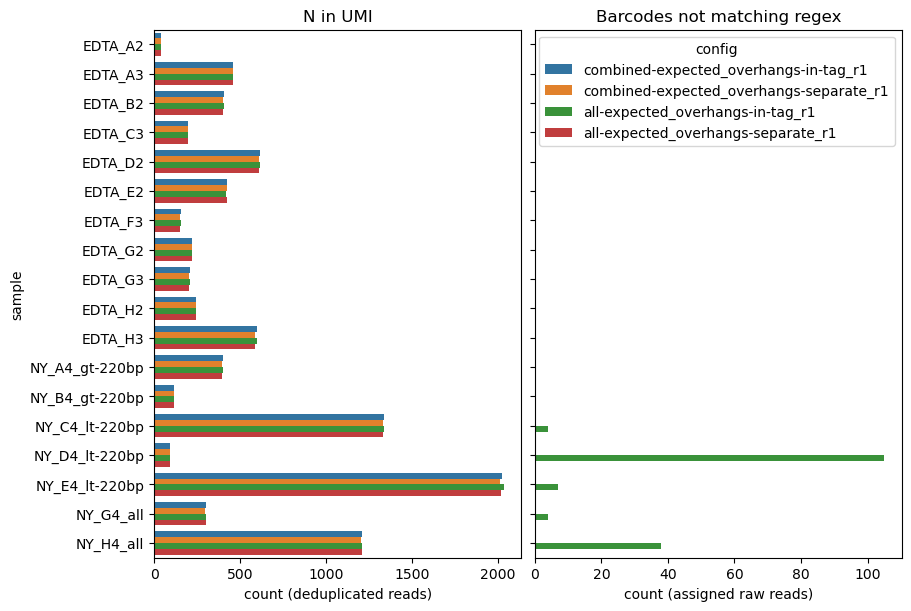

In [144]:
fig, axs = plt.subplots(1, 2, figsize=(9, 6), constrained_layout=True, sharey=True)
sns.barplot(
    df_umi_val_all.loc[(df_umi_val_all['metric'] == 'N in UMI') & (df_umi_val_all['count_type'] == 'dedup')],
    x='count',
    y='sample',
    hue='config',
    ax=axs[0]
)
axs[0].set(title='N in UMI', xlabel='count (deduplicated reads)')
axs[0].get_legend().set_visible(False)
sns.barplot(
    df_umi_val_all.loc[df_umi_val_all['metric'] == 'n_unmatched'],
    x='count',
    y='sample',
    hue='config',
    ax=axs[1]
)
axs[1].set(title='Barcodes not matching regex', xlabel='count (assigned raw reads)', ylabel=None)
fig.show()

## Proportion of structures within a sample

In [142]:
df_structure_prop_all['config_short'] = df_structure_prop_all['config'].str.replace('-expected_', '; ').str.replace('_r1', '')
df_structure_prop_all['overhangs'] = df_structure_prop_all['config'].str.extract('overhangs-([^_]+)')
df_structure_prop_all['config_type'] = df_structure_prop_all['config'].str.extract('^([^-]+)')

In [118]:
# Grouped and stacked bar chart, adapted from 
# https://medium.com/@moritzkoerber/how-to-plot-a-grouped-stacked-bar-chart-in-plotly-df1685b83460
# Alternatively consider https://gist.github.com/ctokheim/6435202a1a880cfecd71

fig = go.Figure(
    layout=dict(
        template='simple_white',
        xaxis=dict(title_text='proportion of assigned, deduplicated reads', title_font_size=12),
        yaxis=dict(title_text='sample and config', title_font_size=12),
        barmode='stack',
        height=800,
        width=800,
        margin=dict(t=25, b=25, l=25, r=25),
        font_size=8,
        legend=dict(font_size=12, title_text='structure')
    )
)

colors = sns.color_palette(n_colors=len(STRUCTURES)).as_hex()

for structure, color in zip(STRUCTURES, colors):
    mask = (df_structure_prop_all['count_type'] == 'dedup') & \
           (df_structure_prop_all['structure'] == structure)
    fig.add_trace(go.Bar(
        x=df_structure_prop_all.loc[mask, 'prop'],
        y=[df_structure_prop_all.loc[mask, 'sample'], df_structure_prop_all.loc[mask, 'config_short']],
        name=structure,
        marker_color=color,
        orientation='h',
    ))

fig

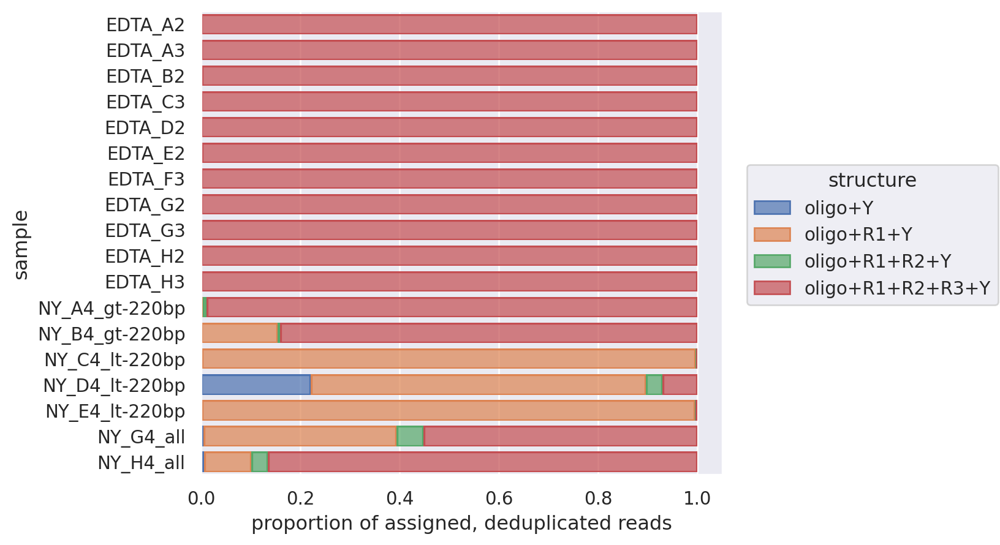

In [148]:
g = (
    so.Plot(
        (
            df_structure_prop_all
            .loc[
                (df_structure_prop_all['config_type'] == 'combined') & \
                (df_structure_prop_all['overhangs'] == 'separate') & \
                (df_structure_prop_all['count_type'] == 'dedup')
            ]
        ),
        y='sample',
        x='prop',
        color='structure')
    .add(so.Bar(), so.Stack())
    .label(x='proportion of assigned, deduplicated reads')
)
g.save(os.path.join(DIR_RESULTS, 'barcode_structure_proportion_dedup.png'), dpi=300, bbox_inches='tight')

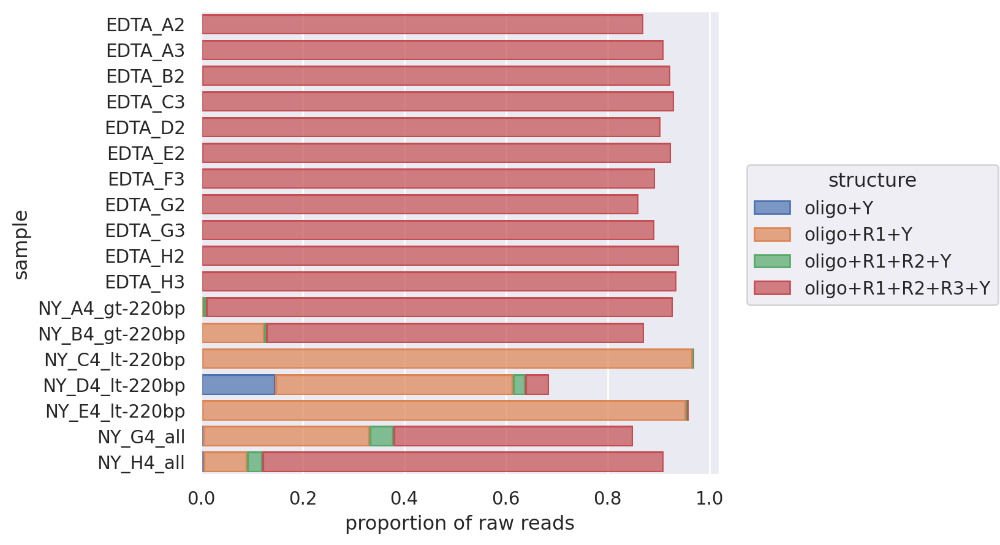

In [149]:
g = (
    so.Plot(
        (
            df_structure_prop_all
            .loc[
                (df_structure_prop_all['config_type'] == 'combined') & \
                (df_structure_prop_all['overhangs'] == 'separate') & \
                (df_structure_prop_all['count_type'] == 'raw')
            ]
        ),
        y='sample',
        x='prop',
        color='structure')
    .add(so.Bar(), so.Stack())
    .label(x='proportion of raw reads')
)
g.save(os.path.join(DIR_RESULTS, 'barcode_structure_proportion_raw.png'), dpi=300, bbox_inches='tight')

## Barcode counts

In [195]:
DTYPE_COUNT_TYPE = pd.api.types.CategoricalDtype(categories=['raw', 'dedup'])

In [199]:
df_barcode_counts_all = pd.concat(
    ((
        pd.concat(
            ((
                df_barcode_counts
                .rename(columns=dict(count_dedup='dedup', count='raw'))
                .melt(
                    id_vars=ROUNDS + ['sample', 'config'],
                    value_name='count',
                    var_name='count_type'
            )) for df_barcode_counts in barcode_counts_dfs[sample].values()),
            axis=0,
            ignore_index=True
        ).pivot(columns='config', index=ROUNDS + ['sample', 'count_type'], values='count')
        .reset_index()
        .astype(dict(count_type=DTYPE_COUNT_TYPE))
        .pipe(lambda df: df.assign(
            **{col: df[col].fillna(0).astype(int) for col in df.columns if 'overhangs' in col}
        ))
    ) for sample in barcode_counts_dfs.keys()),
    axis=0,
    ignore_index=True
)

Compare individual config files vs. integrated config file

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



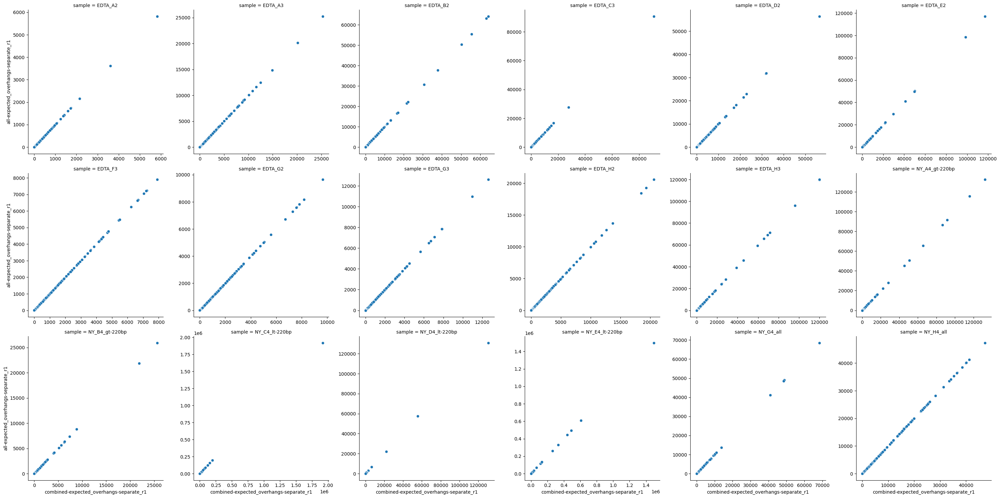

In [208]:
g = sns.relplot(
    kind='scatter',
    data=df_barcode_counts_all.loc[df_barcode_counts_all['count_type'] == 'dedup'],
    x='combined-expected_overhangs-separate_r1',
    y='all-expected_overhangs-separate_r1',
    col='sample',
    col_wrap=6,
    facet_kws=dict(sharex=False, sharey=False)
)

Compare in-tag overhangs vs. separate overhangs

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



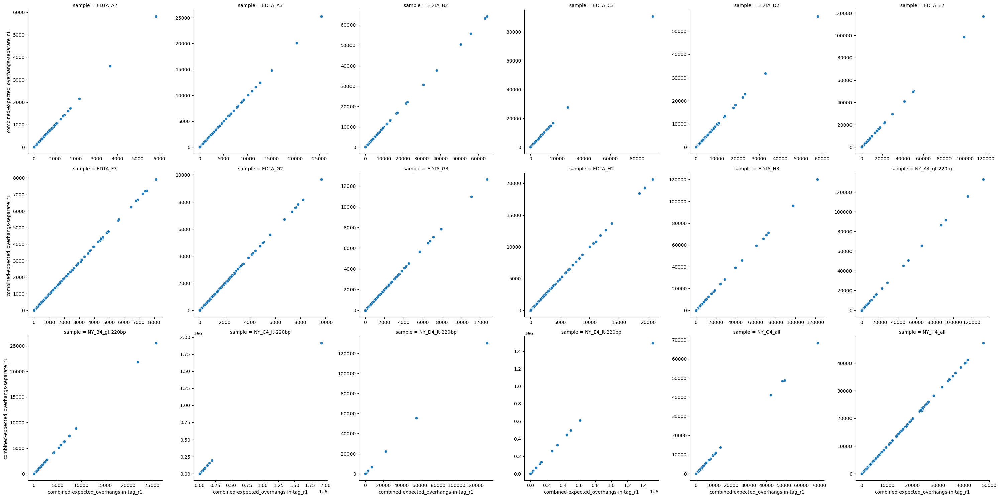

In [209]:
g = sns.relplot(
    kind='scatter',
    data=df_barcode_counts_all.loc[df_barcode_counts_all['count_type'] == 'dedup'],
    x='combined-expected_overhangs-in-tag_r1',
    y='combined-expected_overhangs-separate_r1',
    col='sample',
    col_wrap=6,
    facet_kws=dict(sharex=False, sharey=False)
)

In [230]:
df_terminal_tags_r1_summary

,sample,count,n_reads,proportion_counted,mode_Y-tag_Y,mode_Y-tag_overhang,ratio_mode_to_next,mode_Y-tag_count
0,EDTA_A2,125081,135884,0.920498,16,LigR3,897.244604,124717
1,EDTA_A3,1102998,1257782,0.876939,22,LigR3,1691.955453,1101463
2,EDTA_B2,979206,1104986,0.886171,11,LigR3,215.842759,973235
3,EDTA_C3,466056,513192,0.908151,23,LigR3,614.005284,464802
4,EDTA_D2,1534668,1730567,0.886801,20,LigR3,7907.850515,1534123
5,EDTA_E2,1123790,1232710,0.911642,21,LigR3,352.817952,1116316
6,EDTA_F3,443760,495288,0.895964,15,LigR3,313.429483,442249
7,EDTA_G2,586934,673366,0.871642,14,LigR3,602.254377,584789
8,EDTA_G3,517762,585039,0.885004,23,LigR3,3193.969136,517423
9,EDTA_H2,664501,730435,0.909733,13,LigR3,752.560726,663006


Compare terminal tag counts with `df_terminal_tags_r1_summary` generated earlier: concordant

In [246]:
(
    df_barcode_counts_all
    .loc[df_barcode_counts_all['count_type'] == 'dedup']
    .pipe(lambda df: df.assign(overhang=df.apply(
        lambda row: 'LigEven' if row['R1'] == 0 else ('LigR1' if row['R2'] == 0 else ('LigR2' if row['R3'] == 0 else 'LigR3')),
        axis=1)))
    .groupby(['sample', 'overhang', 'Y'], observed=True)
    .agg(count=('combined-expected_overhangs-separate_r1', 'sum'))
    .reset_index()
    .groupby('sample', group_keys=False)
    .apply(lambda df: df.sort_values('count', ascending=False).head(1))
    .reset_index(drop=True)
    .merge(df_terminal_tags_r1_summary.drop(columns=['count', 'n_reads', 'proportion_counted']))
)

,sample,overhang,Y,count,mode_Y-tag_Y,mode_Y-tag_overhang,ratio_mode_to_next,mode_Y-tag_count
0,EDTA_A2,LigR3,16,114072,16,LigR3,897.244604,124717
1,EDTA_A3,LigR3,22,1076792,22,LigR3,1691.955453,1101463
2,EDTA_B2,LigR3,11,967508,11,LigR3,215.842759,973235
3,EDTA_C3,LigR3,23,458575,23,LigR3,614.005284,464802
4,EDTA_D2,LigR3,20,1475490,20,LigR3,7907.850515,1534123
5,EDTA_E2,LigR3,21,1056526,21,LigR3,352.817952,1116316
6,EDTA_F3,LigR3,15,420990,15,LigR3,313.429483,442249
7,EDTA_G2,LigR3,14,538196,14,LigR3,602.254377,584789
8,EDTA_G3,LigR3,23,496102,23,LigR3,3193.969136,517423
9,EDTA_H2,LigR3,13,647658,13,LigR3,752.560726,663006


In [274]:
df_tag_counts = (
    df_barcode_counts_all
    .melt(
        id_vars=["sample", "count", "count_dedup"],
        value_vars=ROUNDS,
        var_name="round",
        value_name="tag")
    .groupby(["sample", "round", "tag"], observed=True)
    .agg({"count": "sum", "count_dedup": "sum"})
    .reset_index()
    .rename(columns={"count": "no", "count_dedup": "yes"})
    .melt(
        id_vars=["sample", "round", "tag"],
        value_vars=["yes", "no"],
        var_name="deduplication",
        value_name="count")
    .astype(dict(round="category", deduplication="category")))

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



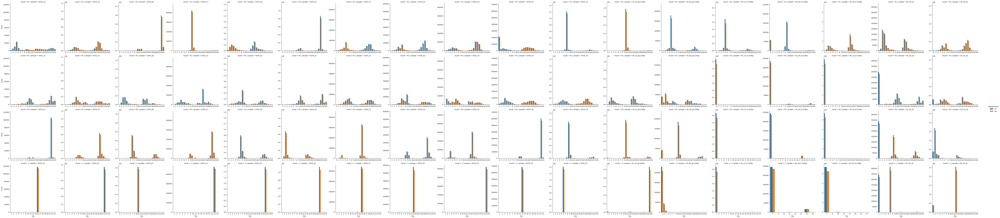

In [276]:
g = sns.catplot(
    df_tag_counts,
    kind='bar',
    x='tag',
    y='count',
    row='round',
    row_order=ROUNDS,
    hue='deduplication',
    col='sample',
    sharex=False,
    sharey='col')

In [278]:
g.figure.savefig(
    os.path.join(DIR_RESULTS, 'tag_counts_by_sample.pdf'),
    bbox_inches='tight',
    dpi=300)

### Proportion of reads matching each expected structure

Proportion of reads from each sample that were properly barcoded (considered "assigned" by splitcode)

In [216]:
for sc_config in splitcode_configs:
    df_data[f'n_assigned-{sc_config}'] = 0
    for sample in df_data['basename'].unique():
        mask_sample = df_data['basename'] == sample
        n_reads = df_data.loc[mask_sample, 'n_reads'].iloc[0]
        path_summary = os.path.join(DIR_PROC, f'summary-{sc_config}-{sample}.json')
        with open(path_summary, 'rt') as f:
            summary = json.load(f)
        assert summary['n_processed'] == n_reads
        # check that all assigned reads had UMIs of length 12
        if summary['n_assigned'] > 0:
            assert summary['extraction_info'][0]['n_reads'] == summary['n_assigned']
            assert summary['extraction_info'][0]['length_min'] == summary['extraction_info'][0]['length_min'] == 12
        df_data.loc[mask_sample, f'n_assigned-{sc_config}'] = summary['n_assigned']

In [211]:
df_prop_assigned = (
    df_data
    [['basename', 'n_reads'] + [x for x in df_data.columns if x.startswith('n_assigned')]]
    .drop_duplicates()
    .pipe(lambda df: df.assign(**{
        f'prop_assigned-{sc_config}': df[f'n_assigned-{sc_config}'] / df['n_reads']
        for sc_config in splitcode_configs
    }))
    .pipe(lambda df: df[[x for x in df.columns if x.startswith('prop_assigned')] + ['basename']])
    .melt(id_vars='basename', var_name='config', value_name='proportion_assigned')
)
df_prop_assigned['structure'] = df_prop_assigned['config'].str.extract('(oligo+[^_]+)')
df_prop_assigned['overhangs'] = df_prop_assigned['config'].str.extract('overhangs-(separate|in-tag)')

In [212]:
# compare overhangs-in-tag vs. overhangs-separate
fig = px.scatter(
    (
        df_prop_assigned
        .drop(columns='config')
        .pivot(index=['basename', 'structure'], values='proportion_assigned', columns='overhangs')
        .reset_index()
    ),
    x='separate',
    y='in-tag',
    color='basename',
    facet_col='structure',
    facet_col_wrap=2
)

fig.update_layout(height=450, margin=dict(l=10, r=10, b=10, t=20))
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_xaxes(matches=None, showticklabels=True)
fig.show()

# # Alternative non-interactive plot using seaborn
# g = sns.relplot(
#     kind='scatter',
#     data=(
#         df_prop_assigned
#         .drop(columns='config')
#         .pivot(index=['basename', 'structure'], values='proportion_assigned', columns='overhangs')
#         .reset_index()
#     ),
#     x='separate',
#     y='in-tag',
#     col='structure',
#     hue='basename',
#     col_wrap=2,
#     facet_kws=dict(sharex=False, sharey=False)
# )

Proportion of (non-deduplicated) reads matching each structure

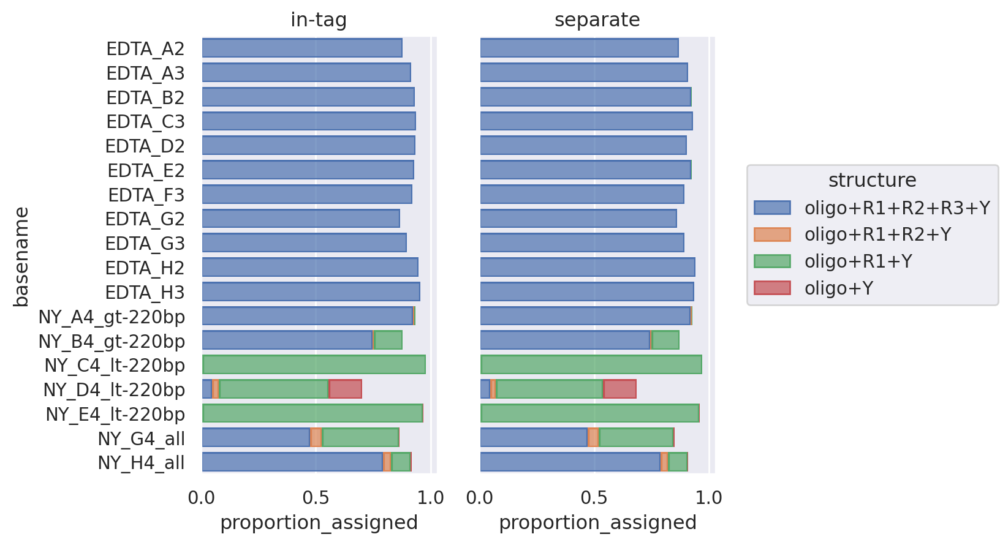

In [213]:
(
    so.Plot(df_prop_assigned, y='basename', x='proportion_assigned', color='structure')
    .add(so.Bar(), so.Stack())
    .facet('overhangs')
)

## Parse barcode counts to DataFrames

- `df_umi_counts`: closest representation of raw data; counts per [[barcode + UMI]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`, `umi`
  - `value_vars`: `count`
- `df_barcode_counts`: counts (both undeduplicated and deduplicated by UMI) per [[barcode]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`
  - `value_vars`: `count`, `count_dedup`
- `df_tag_counts`: counts per [[tag]]
  - format: long
  - `id_vars`: `sample`, `round`, `tag`, `deduplication`
  - `value_vars`: `count`

Final analysis, for each sample, for each structure:
- Deduplicated count
- Estimation of library complexity (at the level of sample-structure, and at the level of sample)
- Sankey/Parcats plots
  - Incorporate "NY" tag: remaining tags become "NA"

In [ ]:
df_barcode_counts_all = []
for sample in df_data['basename'].unique():
    for sc_config in ('all-expected_overhangs-in-tag_r1', 'all-expected_overhangs-separate_r1'):
        path_barcodes = os.path.join(DIR_PROC, f'read_barcodes-{sc_config}-{sample}.txt.gz')
        with gzip.open(path_barcodes, 'rt') as f:
            df_umi_counts, n_unmatched, unmatched = parse_barcodes.barcodes_to_df(
                f,
                regex_barcode_overhangs_separate if 'separate' in sc_config else regex_barcode_overhangs_in_tag)
            df_umi_counts = (
                df_umi_counts
                .fillna(0)
                .astype(dict(R1=np.uint8, R2=np.uint8, R3=np.uint8, Y=np.uint8))
                .groupby(list(df_umi_counts.columns), observed=True).size()
                .reset_index().rename(columns={0: 'count'})
            )
            assert np.array_equal(df_umi_counts['umi'].map(len).unique(), np.array([12]))
            df_barcode_counts = (
                df_umi_counts
                .loc[~df_umi_counts['umi'].str.contains('N')]
                .groupby(ROUNDS, observed=True)["count"]
                .agg(["count", "sum"])
                .reset_index()
                .rename(columns={"count": "count_dedup", "sum": "count"})
            )
            df_barcode_counts['sample'] = pd.Series([sample] * len(df_barcode_counts), dtype=dtype_sample)
            df_barcode_counts['config'] = pd.Series([sc_config] * len(df_barcode_counts), dtype=dtype_sc_config)
            df_barcode_counts_all.append(df_barcode_counts)
df_barcode_counts_all = pd.concat(df_barcode_counts_all, axis=0, ignore_index=True)

In [81]:
np.array_equal(df_umi_counts['umi'].map(len).unique(), np.array([12]))

True

In [75]:
pd.concat(df_barcode_counts_all, axis=0, ignore_index=True)

,R1,R2,R3,Y,count_dedup,count,sample,config
0,1,1,22,16,18,18,EDTA_A2,all-expected_overhangs-in-tag_r1
1,1,2,22,16,10,10,EDTA_A2,all-expected_overhangs-in-tag_r1
2,1,3,9,16,1,1,EDTA_A2,all-expected_overhangs-in-tag_r1
3,1,3,20,16,1,1,EDTA_A2,all-expected_overhangs-in-tag_r1
4,1,3,21,16,1,1,EDTA_A2,all-expected_overhangs-in-tag_r1
...,...,...,...,...,...,...,...,...
183669,24,23,1,13,1,1,NY_H4_all,all-expected_overhangs-separate_r1
183670,24,24,1,13,3,3,NY_H4_all,all-expected_overhangs-separate_r1
183671,24,24,2,13,1,1,NY_H4_all,all-expected_overhangs-separate_r1
183672,24,24,3,13,1,1,NY_H4_all,all-expected_overhangs-separate_r1


In [65]:
regex_barcode_overhangs_separate.search(unmatched[0].strip().split('::')[-1])

In [66]:
target = unmatched[0].strip().split('::')[-1]
target

'[LigEven][R1Top_1][LigR1][R2Top_15][LigR2][R3Top_22][LigR3][NYTop_16][Illumina][2Pbc] RX:Z:AAGGGCTTCTCT'

In [48]:
df_barcodes.loc[df_barcodes['Y'] == 0, 'count'].sum()

0

In [42]:
df_barcodes.groupby(list(df_barcodes.columns), observed=True).size().reset_index().rename(columns={0: 'count'}).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115414 entries, 0 to 115413
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   R1      115414 non-null  uint8 
 1   R2      115414 non-null  uint8 
 2   R3      115414 non-null  uint8 
 3   Y       115414 non-null  uint8 
 4   umi     115414 non-null  object
 5   count   115414 non-null  int64 
dtypes: int64(1), object(1), uint8(4)
memory usage: 2.2+ MB


In [ ]:
sample_barcode_counts = dict()
sample_barcode_inconsistencies = []
path_barcode_inconsistencies = os.path.join(DIR_PROC, 'barcode_inconsistencies.csv')
for sample in df_data['basename'].unique():
    path_read_barcodes = os.path.join(DIR_PROC, f'read_barcodes-{sample}.txt.gz')
    path_barcode_counts = os.path.join(DIR_PROC, f'barcode_counts-{sample}.json.gz')
    if not os.path.exists(path_barcode_counts):
        sample_data = dict()
        no_match = 0
        no_umi = 0
        bad_umi = 0
        with gzip.open(path_read_barcodes, 'rt') as f:
            for name in f:
                name = name.strip()
                match = regex_oligo_cell_barcode.search(name)
                if match:
                    tags = match.groupdict()
                    barcode = tags['barcode']
                    umi = regex_umi.search(name)
                    if umi is None:
                        no_umi += 1
                        continue
                    else:
                        umi = umi.group(1)
                        if 'N' in umi:
                            bad_umi += 1
                            continue
                    if barcode not in sample_data:
                        sample_data[barcode] = collections.defaultdict(int)
                    sample_data[barcode][umi] += 1
                else:
                    no_match += 1
        with gzip.open(path_barcode_counts, 'wt') as f:
            json.dump(sample_data, f)
        sample_barcode_inconsistencies.append({
            'sample': sample,
            'no_match': no_match,
            'no_umi': no_umi,
            'bad_umi': bad_umi
        })
    else:
        print(f'{sample}: loading existing counts')
        with gzip.open(path_barcode_counts, 'rt') as f:
            sample_data = json.load(f)
    sample_barcode_counts[sample] = sample_data

In [144]:
df_umi_counts = []
for sample, sample_data in sample_barcode_counts.items():
    for barcode, barcode_data in sample_data.items():
        for umi, count in barcode_data.items():
            df_umi_counts.append([sample, barcode, umi, count])
df_umi_counts = pd.DataFrame(df_umi_counts, columns=['sample', 'barcode', 'umi', 'count']) \
    .astype(dict(sample='category'))

In [151]:
df_umi_counts = pd.concat(
    (
        df_umi_counts.drop(columns='barcode'),
        df_umi_counts["barcode"].str.extract((
            r'\[R1Top_(?P<R1>\d+)\]'
            r'(?:\[LigR1\])?'
            r'\[R2Top_(?P<R2>\d+)\]'
            r'(?:\[LigR2\])?'
            r'\[R3Top_(?P<R3>\d+)\]'
            r'(?:\[LigR3\])?'
            r'\[NYLigOddStgTop_(?P<Y>\d+)\]'
        ))),
    axis=1
).astype(dict(R1=np.uint8, R2=np.uint8, R3=np.uint8, Y=np.uint8))

In [152]:
df_barcode_counts = (
    df_umi_counts.groupby(["sample"] + ROUNDS, observed=True)["count"]
    .agg(["count", "sum"])
    .reset_index()
    .rename(columns={"count": "count_dedup", "sum": "count"})
)

In [153]:
df_tag_counts = (
    df_barcode_counts
    .melt(
        id_vars=["sample", "count", "count_dedup"],
        value_vars=ROUNDS,
        var_name="round",
        value_name="tag")
    .groupby(["sample", "round", "tag"], observed=True)
    .agg({"count": "sum", "count_dedup": "sum"})
    .reset_index()
    .rename(columns={"count": "no", "count_dedup": "yes"})
    .melt(
        id_vars=["sample", "round", "tag"],
        value_vars=["yes", "no"],
        var_name="deduplication",
        value_name="count")
    .astype(dict(round="category", deduplication="category")))

### Check for tags that are missing from this dataset

The R1, R2, or R3 have no missing tags, as expected.

Oddly, NYLigOdd tags 6, 11, 12, and 24 are rare/missing.

In [28]:
expected_tags = {
    'R1': set(range(1, 25)),
    'R2': set(range(1, 25)),
    'R3': set(range(1, 25))}

In [29]:
df_missing_tags = []
assert (df_tag_counts['count'] > 0).all()
for sample, group in df_tag_counts.groupby('sample'):
    for r in ROUNDS:
        missing_tags = expected_tags[r] - set(group.loc[group['round'] == r, 'tag'])
        rare_tags = set(group.loc[
            (group['round'] == r) &
            (group['deduplication'] == 'yes') &
            (group['count'] > 0) &
            (group['count'] < 50),
            'tag'])
        assert len(missing_tags & rare_tags) == 0
        df_missing_tags.append(dict(
            sample=sample,
            round=r,
            missing_tags=missing_tags,
            rare_tags=rare_tags))
df_missing_tags = pd.DataFrame(df_missing_tags).sort_values(['round', 'sample'])
df_missing_tags

,sample,round,missing_tags,rare_tags
0,A3,R1,{},{}
3,A4,R1,{},{}
6,A5,R1,{},{}
9,B3,R1,{},{}
12,C3,R1,{},{}
15,C5,R1,{},{}
18,D3,R1,{},{}
1,A3,R2,{},{}
4,A4,R2,{},{}
7,A5,R2,{},{}


# Old

In [24]:
regex_distances = re.compile(r'((?P<dist_hamming>\d+):(?P<dist_indel>\d+):)?(?P<dist_total>\d+)')

# read config file into pandas DataFrame
# - seek to first line after lines starting with '@' or '#'; 
#     pd.read_csv() only supports a single character comment
# - need to open file as binary to enable f.tell() to work
with open(path_config, 'rb') as f:
    pos = f.tell()
    for line in f:
        line = line.decode().strip()
        if line.startswith('#') or line.startswith('@') or line == '':
            pos = f.tell()
            continue
        f.seek(pos)
        break
    df_config = pd.read_csv(f, sep='\t')

variant_maps = dict()
for tag_group in df_config['groups'].unique():
    mask_tag_group = df_config['groups'] == tag_group
    seqs = set(df_config.loc[mask_tag_group, 'tags'])
    distances = df_config.loc[mask_tag_group, 'distances'].unique()
    assert len(distances) == 1
    distances = regex_distances.match(distances[0]).groupdict()
    for k in distances:
        if distances[k] is not None:
            distances[k] = int(distances[k])
    variant_maps[tag_group] = string_distances.generate_variant_map(seqs, **distances, verify_unique=True)

all_variants = set()
for tag_group, variants in variant_maps.items():
    assert len(set(variants.keys()) & all_variants) == 0
    all_variants |= set(variants.keys())

AssertionError: 

## Analysis by group

4 splitcode configurations
- 2 ways to identify tags
  - Identify all tag sequences in reads
    - Disadvantages
      - Cannot set high error tolerance --> lower sensitivity
      - Need to post-process to extract specific expected structurs
  - Only identify specific expected structures: requires that the proportion of such reads is sufficiently high
    - Oligo + NYLigEvenStg_1
    - Oligo + R1 + NYLigR1Stg_1
    - Oligo + R1 + R2 + NYLigR2Stg_1
    - Oligo + R1 + R2 + R3 + NYLigOdd
- 2 ways to specify tags
  - Separate spacers from unique sequences
  - Combine spacers and unique sequences

Additional considerations
- Whether to identify tags or tag groups
  - Tag grouping precludes barcode counting
  - Tag grouping enables higher sensitivity by allowing "conflicts" between tags of the same group to be resolved to the tag group [[splitcode FAQ](https://splitcode.readthedocs.io/en/latest/FAQ.html#what-is-the-difference-between-multiple-sequences-being-part-of-the-same-tag-and-each-sequence-being-part-of-a-different-tag)]
- Read 1 or Read 2

Total split-pool configs

| Name | Tag identifcation | Tag specification | Read | Tag grouping |
| ---- | ----------------- | ----------------- | ---- | ------------ |

In [17]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-groups_only_r1.tsv')

# read config file into pandas DataFrame
# - seek to first line after lines starting with '@' or '#'; 
#     pd.read_csv() only supports a single character comment
# - need to open file as binary to enable f.tell() to work
with open(path_config, 'rb') as f:
    pos = f.tell()
    for line in f:
        line = line.decode().strip()
        if line.startswith('#') or line.startswith('@') or line == '':
            pos = f.tell()
            continue
        f.seek(pos)
        break
    df_config = pd.read_csv(f, sep='\t')

Check that tags do not have collisions

In [21]:
regex_distances = re.compile(r'((?P<dist_hamming>\d+):(?P<dist_indel>\d+):)?(?P<dist_total>\d+)')
variant_maps = dict()
for tag_group in df_config['groups'].unique():
    mask_tag_group = df_config['groups'] == tag_group
    seqs = set(df_config.loc[mask_tag_group, 'tags'])
    distances = df_config.loc[mask_tag_group, 'distances'].unique()
    assert len(distances) == 1
    distances = regex_distances.match(distances[0]).groupdict()
    for k in distances:
        if distances[k] is not None:
            distances[k] = int(distances[k])
    variant_maps[tag_group] = string_distances.generate_variant_map(seqs, **distances, verify_unique=True)

In [22]:
all_variants = set()
for tag_group, variants in variant_maps.items():
    assert len(set(variants.keys()) & all_variants) == 0
    all_variants |= set(variants.keys())

### Parse Read 1

In [23]:
%%bash -s {DIR_DATA} {DIR_PROC} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    if [ ! -f "$path_counts" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --loc-names --no-outb -t 8 \
            --mapping=/dev/null --output=/dev/stdout \
            "$path_R1" |
        awk '$1 ~ /^@/' |
        grep -o "LX:Z:.*" |
        sed -E -e 's/LX:Z://' -e 's/:0,/:/g' |
        sort |
        uniq -c |
        sed -E -e 's/^ *//' -e 's/ /\t/' |
        sort -n -r > "$path_counts"
    fi
done

* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231208/scBarcode-EDTA_A2_R1.fastq.gz
* processing the reads ...
done 
* processed 135,884 reads, 135,882 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231208/scBarcode-EDTA_A3_R1.fastq.gz
* processing the reads ...
done 
* processed 1,257,782 reads, 1,257,776 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231208/scBarcode-EDTA_B2_R1.fastq.gz
* processing the reads ...
done 
* processed 1,104,986 reads, 1,104,961 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: 

Analysis of each sample
- Most common read structures
- Proportion of reads matching expected structures
- Proportion of reads with R1/R2/R3 dimers

Proportion of reads matching expected structure

In [59]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_RESULTS} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_RESULTS="$3"
PATH_CONFIG="$4"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_analysis="${DIR_RESULTS}/tag_group_analysis-${SAMPLE}.csv"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    total_reads=$(cat "$path_counts" |
        cut -f 1 |
        awk '{sum += $1} END {print sum}')

    echo -n "${SAMPLE},expected structure," > "$path_analysis"
    cat "$path_counts" |
        sed -E -e 's/:[0-9]+-[0-9]+//g' |
        grep -E -e "LigEven,R1Top,LigR1,R2Top,LigR2,R3Top,LigR3,NYLigOddStgTop,Illumina" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},Illumina adapter," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "Illumina" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R1 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R1Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R1Top:\2-([0-9]+),LigR1:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R2 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R2Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R2Top:\2-([0-9]+),LigR2:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R3 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R3Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R3Top:\2-([0-9]+),LigR3:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"
done

In [71]:
df_group_analysis_r1 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_RESULTS, f'tag_group_analysis-{sample}_R1.csv')
    df_group_analysis_r1.append(pd.read_csv(path_analysis, header=None, names=['sample', 'structure', 'count', 'total']))
df_group_analysis_r1 = (
    pd.concat(df_group_analysis_r1, axis=0)
    .fillna(0)
    .astype(dict(count=int, total=int))
    .pipe(lambda df: df.assign(
        proportion=df['count'] / df['total'],
        sample=df['sample'].str.replace('_R1$', '', regex=True)
    ))
    .merge(df_data[['basename', 'quench']].rename(columns={'basename': 'sample'}))
)

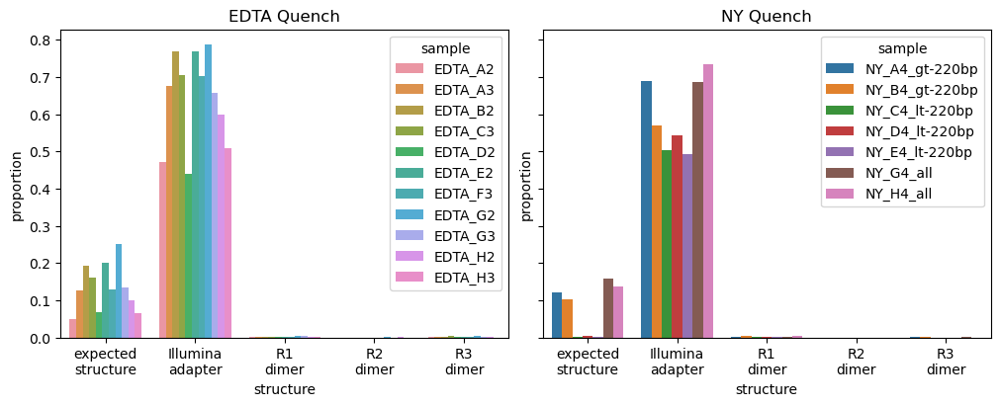

In [78]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharex=False, sharey=True, constrained_layout=True)
sns.barplot(
    df_group_analysis_r1 \
        .assign(structure=df_group_analysis_r1['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r1['quench'] == 'EDTA'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[0]
)
axs[0].set_title('EDTA Quench')
sns.barplot(
    df_group_analysis_r1 \
        .assign(structure=df_group_analysis_r1['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r1['quench'] == 'NY'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[1]
)
axs[1].set_title('NY Quench')
fig.show()

### Parse Read 2

In [79]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-groups_only.tsv')

In [80]:
%%bash -s {DIR_DATA} {DIR_PROC} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

for path_R2 in "$DIR_DATA"/*R2.fastq.gz; do
    SAMPLE="$(echo "$path_R2" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R2')"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    if [ ! -f "$path_counts" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --loc-names --no-outb -t 8 \
            --mapping=/dev/null --output=/dev/stdout \
            "$path_R2" |
        awk '$1 ~ /^@/' |
        grep -o "LX:Z:.*" |
        sed -E -e 's/LX:Z://' -e 's/:0,/:/g' |
        sort |
        uniq -c |
        sed -E -e 's/^ *//' -e 's/ /\t/' |
        sort -n -r > "$path_counts"
    fi
done

* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R2.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 24,223 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R2.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 75,239 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R2.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 33,225 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/gu

Proportion of reads matching expected structure

In [81]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_RESULTS} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_RESULTS="$3"
PATH_CONFIG="$4"

for path_R2 in "$DIR_DATA"/*R2.fastq.gz; do
    SAMPLE="$(echo "$path_R2" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R2')"
    path_analysis="${DIR_RESULTS}/tag_group_analysis-${SAMPLE}.csv"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    total_reads=$(cat "$path_counts" | cut -f 1 | awk '{sum += $1} END {print sum}')

    echo -n "${SAMPLE},expected structure," > "$path_analysis"
    cat "$path_counts" |
        sed -E -e 's/:[0-9]+-[0-9]+//g' |
        grep -E -e "NYStgBot,R3,R3Bot,R2,R2Bot,R1,R1Bot,Even,([^,]+,){1,2}2Puni" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R1 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R1Bot:[0-9]+-([0-9]+),R1:\1-([0-9]+),R1Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R2 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R2Bot:[0-9]+-([0-9]+),R2:\1-([0-9]+),R2Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R3 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R3Bot:[0-9]+-([0-9]+),R3:\1-([0-9]+),R3Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"
done

In [83]:
df_group_analysis_r2 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_RESULTS, f'tag_group_analysis-{sample}_R2.csv')
    df_group_analysis_r2.append(pd.read_csv(path_analysis, header=None, names=['sample', 'structure', 'count', 'total']))
df_group_analysis_r2 = (
    pd.concat(df_group_analysis_r2, axis=0)
    .fillna(0)
    .astype(dict(count=int, total=int))
    .pipe(lambda df: df.assign(
        proportion=df['count'] / df['total'],
        sample=df['sample'].str.replace('_R2$', '', regex=True)
    ))
    .merge(df_data[['basename', 'quench']].rename(columns={'basename': 'sample'}))
)

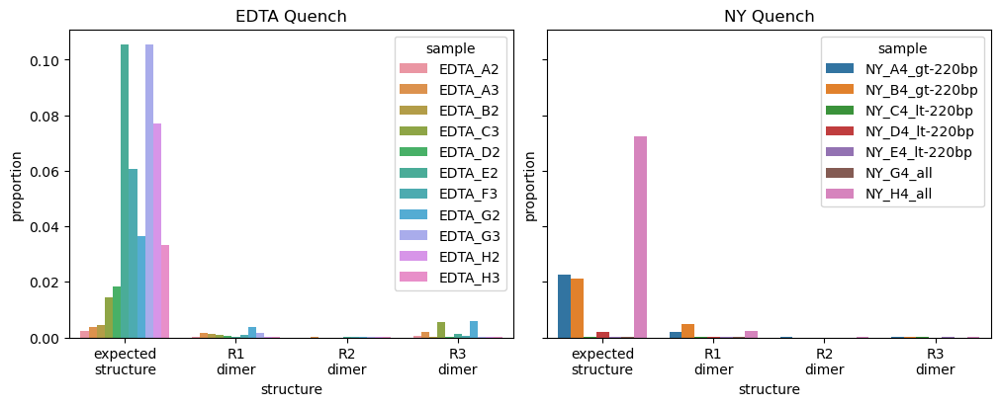

In [84]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharex=False, sharey=True, constrained_layout=True)
sns.barplot(
    df_group_analysis_r2 \
        .assign(structure=df_group_analysis_r2['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r2['quench'] == 'EDTA'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[0]
)
axs[0].set_title('EDTA Quench')
sns.barplot(
    df_group_analysis_r2 \
        .assign(structure=df_group_analysis_r2['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r2['quench'] == 'NY'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[1]
)
axs[1].set_title('NY Quench')
fig.show()

# Count barcodes

## Splitcode

1. Add barcode and UMI to read name

   `@read::[LigEven][R1Top][LigR1][R2Top][LigR2][R3Top][LigR3][NYLigOddStgTop][Illumina] RX:Z:<UMI>`

2. Calculate barcode counts

### Config file

Only use read 1 (120 bp)

In [107]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-r1_expected_structure.tsv')

# read config file into pandas DataFrame
# - seek to first line after lines starting with '@' or '#'; 
#     pd.read_csv() only supports a single character comment
# - need to open file as binary to enable f.tell() to work
with open(path_config, 'rb') as f:
    pos = f.tell()
    for line in f:
        line = line.decode().strip()
        if line.startswith('#') or line.startswith('@') or line == '':
            pos = f.tell()
            continue
        f.seek(pos)
        break
    df_config = pd.read_csv(f, sep='\t')

Check that tags do not have collisions

In [108]:
regex_distances = re.compile(r'((?P<dist_hamming>\d+):(?P<dist_indel>\d+):)?(?P<dist_total>\d+)')
variant_maps = dict()
for tag_group in df_config['groups'].unique():
    mask_tag_group = df_config['groups'] == tag_group
    seqs = set(df_config.loc[mask_tag_group, 'tags'])
    distances = df_config.loc[mask_tag_group, 'distances'].unique()
    assert len(distances) == 1
    distances = regex_distances.match(distances[0]).groupdict()
    for k in distances:
        if distances[k] is not None:
            distances[k] = int(distances[k])
    variant_maps[tag_group] = string_distances.generate_variant_map(seqs, **distances, verify_unique=True)

In [109]:
all_variants = set()
for tag_group, variants in variant_maps.items():
    assert len(set(variants.keys()) & all_variants) == 0
    all_variants |= set(variants.keys())

### Run splitcode

In [110]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_AUX} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_AUX="$3"
PATH_CONFIG="$4"

source ~/.bashrc

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1' | sed -E -e 's/_R1$//')"
    PATH_MAPPING="${DIR_PROC}/mapping-${SAMPLE}.tsv"
    PATH_SUMMARY="${DIR_PROC}/summary-${SAMPLE}.json"
    PATH_OUTPUT="${DIR_PROC}/read_barcodes-${SAMPLE}.txt.gz"

    if [ ! -f "$PATH_OUTPUT" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --mod-names --x-names --no-x-out --no-outb --out-fasta -t 8 \
            --mapping="$PATH_MAPPING" --summary="$PATH_SUMMARY" --output=/dev/stdout \
            "$path_R1" |
        awk '$1 ~ /^>/' |
        pigz -p 8 > "$PATH_OUTPUT"
    fi
done

* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R1.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 4,516 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R1.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 28,733 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R1.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 15,968 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sampl

Proportion of reads from each sample that were properly barcoded (considered "assigned" by splitcode)

In [130]:
df_data['n_assigned'] = 0
for sample in df_data['basename'].unique():
    mask_sample = df_data['basename'] == sample
    n_reads = df_data.loc[mask_sample, 'n_reads'].iloc[0]
    path_summary = os.path.join(DIR_PROC, f'summary-{sample}.json')
    with open(path_summary, 'rt') as f:
        summary = json.load(f)
    assert summary['n_processed'] == n_reads
    df_data.loc[mask_sample, 'n_assigned'] = summary['n_assigned']

In [131]:
(df_data[['basename', 'n_reads', 'n_assigned']].drop_duplicates()
    .set_index('basename')
    .pipe(lambda df: df.assign(prop_assigned=df['n_assigned'] / df['n_reads']))['prop_assigned'])

basename
EDTA_A2           0.173093
EDTA_A3           0.356250
EDTA_B2           0.451571
EDTA_C3           0.418473
EDTA_D2           0.207240
EDTA_E2           0.480709
EDTA_F3           0.357373
EDTA_G2           0.534371
EDTA_G3           0.346407
EDTA_H2           0.308250
EDTA_H3           0.199135
NY_A4_gt-220bp    0.317321
NY_B4_gt-220bp    0.274988
NY_C4_lt-220bp    0.001926
NY_D4_lt-220bp    0.009663
NY_E4_lt-220bp    0.001893
NY_G4_all         0.327546
NY_H4_all         0.347297
Name: prop_assigned, dtype: float64

## Parse identified barcodes to counts

Structure of `sample_barcode_counts` dictionary
- key: sample
- value: `sample_data`
  - key: barcode
  - value: `barcode_data`
    - key: UMI
    - value: count

Note that a handful of UMIs contain bases recorded as `N`.

In [132]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
zcat "$DIR_PROC/read_barcodes-EDTA_A2.txt.gz" | grep -E -e 'RX:Z:[ATCG]*N[ATCG]*'

>AV233703:20231204:2323517709:2:20702:2858:1622::[LigEven][R1Top_3][LigR1][R2Top_8][R3Top_11][NYLigOddStgTop_16][Illumina] RX:Z:NAGCTTCACTCA
>AV233703:20231204:2323517709:2:21905:5286:2423::[LigEven][R1Top_4][LigR1][R2Top_10][LigR2][R3Top_22][LigR3][NYLigOddStgTop_16][Illumina] RX:Z:GTTAAGNAGCGT


In [ ]:
[LigEven][R1Top][LigR1][R2Top][LigR2][R3Top][LigR3][NYLigOddStgTop][Illumina] RX:Z:<UMI>

In [134]:
regex_oligo_cell_barcode = re.compile((
    r'(?P<barcode>'
    r'\[R1Top_(?P<R1>\d+)\]'
    r'\[LigR1\]'
    r'\[R2Top_(?P<R2>\d+)\]'
    r'\[LigR2\]'
    r'\[R3Top_(?P<R3>\d+)\]'
    r'\[LigR3\]'
    r'\[NYLigOddStgTop_(?P<Y>\d+)\])'
))
regex_umi = re.compile(r'RX:Z:([ATCGN]+)')

In [140]:
sample_barcode_counts = dict()
sample_barcode_inconsistencies = []
path_barcode_inconsistencies = os.path.join(DIR_PROC, 'barcode_inconsistencies.csv')
for sample in df_data['basename'].unique():
    path_read_barcodes = os.path.join(DIR_PROC, f'read_barcodes-{sample}.txt.gz')
    path_barcode_counts = os.path.join(DIR_PROC, f'barcode_counts-{sample}.json.gz')
    if not os.path.exists(path_barcode_counts):
        sample_data = dict()
        no_match = 0
        no_umi = 0
        bad_umi = 0
        with gzip.open(path_read_barcodes, 'rt') as f:
            for name in f:
                name = name.strip()
                match = regex_oligo_cell_barcode.search(name)
                if match:
                    tags = match.groupdict()
                    barcode = tags['barcode']
                    umi = regex_umi.search(name)
                    if umi is None:
                        no_umi += 1
                        continue
                    else:
                        umi = umi.group(1)
                        if 'N' in umi:
                            bad_umi += 1
                            continue
                    if barcode not in sample_data:
                        sample_data[barcode] = collections.defaultdict(int)
                    sample_data[barcode][umi] += 1
                else:
                    no_match += 1
        with gzip.open(path_barcode_counts, 'wt') as f:
            json.dump(sample_data, f)
        sample_barcode_inconsistencies.append({
            'sample': sample,
            'no_match': no_match,
            'no_umi': no_umi,
            'bad_umi': bad_umi
        })
    else:
        print(f'{sample}: loading existing counts')
        with gzip.open(path_barcode_counts, 'rt') as f:
            sample_data = json.load(f)
    sample_barcode_counts[sample] = sample_data

In [141]:
if len(sample_barcode_inconsistencies) > 0:
    sample_barcode_inconsistencies = pd.DataFrame(sample_barcode_inconsistencies)
    sample_barcode_inconsistencies.to_csv(path_barcode_inconsistencies)
else:
    sample_barcode_inconsistencies = pd.read_csv(path_barcode_inconsistencies)

In [142]:
print('no_match = reads with missing tags')
print('no_umi = reads lacking 12 bp UMI')
print('bad_umi = reads whose UMIs contain \'N\'')
display(sample_barcode_inconsistencies)

no_match = reads with missing tags
no_umi = reads lacking 12 bp UMI
bad_umi = reads whose UMIs contain 'N'


,sample,no_match,no_umi,bad_umi
0,EDTA_A2,1489,171,1
1,EDTA_A3,8893,1145,14
2,EDTA_B2,4265,495,8
3,EDTA_C3,8439,553,13
4,EDTA_D2,14722,1598,12
5,EDTA_E2,12927,1268,32
6,EDTA_F3,3774,747,7
7,EDTA_G2,3168,400,8
8,EDTA_G3,6691,1039,11
9,EDTA_H2,4980,573,6


In [143]:
print(
    'Total number of read pairs with correct barcode structure:',
    sum(
        sum(barcode_data.values())
        for sample_data in sample_barcode_counts.values()
        for barcode_data in sample_data.values()))

Total number of read pairs with correct barcode structure: 284542


### Parse barcode counts to DataFrames

- `df_umi_counts`: closest representation of raw data; counts per [[barcode + UMI]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`, `umi`
  - `value_vars`: `count`
- `df_barcode_counts`: counts (both undeduplicated and deduplicated by UMI) per [[barcode]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`
  - `value_vars`: `count`, `count_dedup`
- `df_tag_counts`: counts per [[tag]]
  - format: long
  - `id_vars`: `sample`, `round`, `tag`, `deduplication`
  - `value_vars`: `count`

In [144]:
df_umi_counts = []
for sample, sample_data in sample_barcode_counts.items():
    for barcode, barcode_data in sample_data.items():
        for umi, count in barcode_data.items():
            df_umi_counts.append([sample, barcode, umi, count])
df_umi_counts = pd.DataFrame(df_umi_counts, columns=['sample', 'barcode', 'umi', 'count']) \
    .astype(dict(sample='category'))

In [151]:
df_umi_counts = pd.concat(
    (
        df_umi_counts.drop(columns='barcode'),
        df_umi_counts["barcode"].str.extract((
            r'\[R1Top_(?P<R1>\d+)\]'
            r'(?:\[LigR1\])?'
            r'\[R2Top_(?P<R2>\d+)\]'
            r'(?:\[LigR2\])?'
            r'\[R3Top_(?P<R3>\d+)\]'
            r'(?:\[LigR3\])?'
            r'\[NYLigOddStgTop_(?P<Y>\d+)\]'
        ))),
    axis=1
).astype(dict(R1=np.uint8, R2=np.uint8, R3=np.uint8, Y=np.uint8))

In [152]:
df_barcode_counts = (
    df_umi_counts.groupby(["sample"] + ROUNDS, observed=True)["count"]
    .agg(["count", "sum"])
    .reset_index()
    .rename(columns={"count": "count_dedup", "sum": "count"})
)

In [153]:
df_tag_counts = (
    df_barcode_counts
    .melt(
        id_vars=["sample", "count", "count_dedup"],
        value_vars=ROUNDS,
        var_name="round",
        value_name="tag")
    .groupby(["sample", "round", "tag"], observed=True)
    .agg({"count": "sum", "count_dedup": "sum"})
    .reset_index()
    .rename(columns={"count": "no", "count_dedup": "yes"})
    .melt(
        id_vars=["sample", "round", "tag"],
        value_vars=["yes", "no"],
        var_name="deduplication",
        value_name="count")
    .astype(dict(round="category", deduplication="category")))

### Check for tags that are missing from this dataset

The R1, R2, or R3 have no missing tags, as expected.

Oddly, NYLigOdd tags 6, 11, 12, and 24 are rare/missing.

In [28]:
expected_tags = {
    'R1': set(range(1, 25)),
    'R2': set(range(1, 25)),
    'R3': set(range(1, 25))}

In [29]:
df_missing_tags = []
assert (df_tag_counts['count'] > 0).all()
for sample, group in df_tag_counts.groupby('sample'):
    for r in ROUNDS:
        missing_tags = expected_tags[r] - set(group.loc[group['round'] == r, 'tag'])
        rare_tags = set(group.loc[
            (group['round'] == r) &
            (group['deduplication'] == 'yes') &
            (group['count'] > 0) &
            (group['count'] < 50),
            'tag'])
        assert len(missing_tags & rare_tags) == 0
        df_missing_tags.append(dict(
            sample=sample,
            round=r,
            missing_tags=missing_tags,
            rare_tags=rare_tags))
df_missing_tags = pd.DataFrame(df_missing_tags).sort_values(['round', 'sample'])
df_missing_tags

,sample,round,missing_tags,rare_tags
0,A3,R1,{},{}
3,A4,R1,{},{}
6,A5,R1,{},{}
9,B3,R1,{},{}
12,C3,R1,{},{}
15,C5,R1,{},{}
18,D3,R1,{},{}
1,A3,R2,{},{}
4,A4,R2,{},{}
7,A5,R2,{},{}


# (TBR) Sequencing Depth and Duplicates

## UMI distribution

In [30]:
with pd.option_context('display.float_format', '{:,g}'.format):
    display(df_umi_counts['count'].describe())

count   1.19642e+07
mean        1.31043
std        0.613069
min               1
25%               1
50%               1
75%               1
max              11
Name: count, dtype: float64

Distribution of UMIs per sample

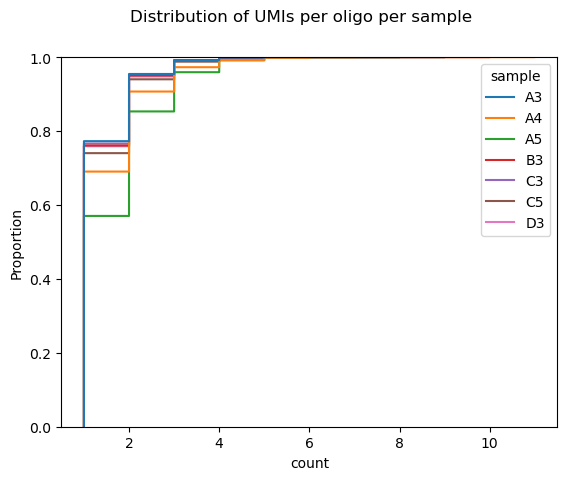

In [31]:
ax = sns.ecdfplot(
    df_umi_counts,
    x='count',
    hue='sample')
ax.figure.suptitle('Distribution of UMIs per oligo per sample')
ax.figure.show()

### Estimate library complexity from sequencing/UMI duplicates

Note: The current method of library complexity estimation assumes that the number of available UMIs far exceeds the number of unique molecules, and therefore underestimates the true library complexity. A better model would account for the possibility of real UMI collisions, and as a consequence of PCR duplicates/sequencing.

In [32]:
def estimate_library_complexity(count_total, count_dedup, max_err=1e-3):
    '''
    See https://github.com/bentyeh/resources/blob/main/bioinformatics/models_genomics.md
    '''
    res = scipy.optimize.minimize_scalar(
      fun=lambda M: (M * (1 - np.exp(-count_total/M)) - count_dedup)**2,
      bracket=(count_dedup, count_total*2)
    )
    assert res.fun < max_err
    return res.x

In [33]:
umi_complexity = 4**12
print('Maximum UMI complexity:', umi_complexity)

Maximum UMI complexity: 16777216


#### Option 1: From all barcodes per sample

In [34]:
complexity_umi_all = df_barcode_counts.groupby('sample')[['count', 'count_dedup']].sum().apply(
    lambda s: estimate_library_complexity(s['count'], s['count_dedup']),
    axis=1)

#### Option 2: From predominant barcode per sample

In [35]:
top_barcode_counts = (
    df_barcode_counts
    .groupby("sample", group_keys=True)
    .apply(lambda group: group.loc[group["count"] == group["count"].max(), ["count", "count_dedup"]])
    .droplevel(1, axis=0))

In [36]:
complexity_umi_top = top_barcode_counts.apply(
    lambda s: estimate_library_complexity(s["count"], s["count_dedup"]), axis=1)

#### Plot

In [37]:
df_data = df_data.merge(
    pd.concat(
        (
            complexity_umi_top.rename("complexity_umi_est_top"),
            complexity_umi_all.rename("complexity_umi_est_all"),
            df_umi_counts.groupby('sample')['count'].count().rename("complexity_obs"),
        ),
        axis=1,
    ).reset_index(),
    how="left",
    on="sample",
)

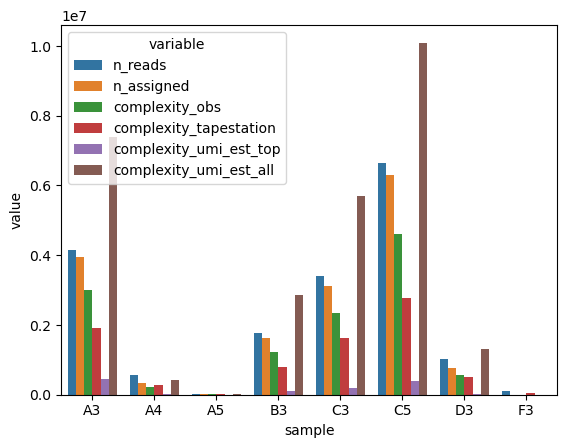

In [38]:
ax = sns.barplot(
    df_data[['sample', 'n_reads', 'n_assigned', 'complexity_obs', 'complexity_tapestation', 'complexity_umi_est_top', 'complexity_umi_est_all']] \
        .drop_duplicates() \
        .melt(id_vars='sample'),
    x='sample',
    y='value',
    hue='variable')

#### Estimated coverage and duplication rate

"Coverage" = proportion of physical molecules that were sequenced and assigned.
- Assume sampling `n_assigned` reads from `complexity_tapestation` molecules.

In [39]:
df_data[['sample', 'n_assigned', 'complexity_tapestation']].drop_duplicates() \
    .set_index('sample')\
    .apply(
        lambda s: 1 - scipy.stats.binom.pmf(0, n=s['n_assigned'], p=1/s['complexity_tapestation']),
        axis=1) \
    .rename('coverage')

sample
A3    0.873819
A4    0.710524
A5    0.587271
B3    0.870799
C3    0.852320
C5    0.896294
D3    0.780152
F3    0.000000
Name: coverage, dtype: float64

Duplication rate = proportion of sequenced and assigned reads that are duplicates

In [40]:
df_barcode_counts.groupby('sample')[['count_dedup', 'count']].sum().pipe(
    lambda df: df.assign(**{
        'duplication rate': (df['count'] - df['count_dedup'])/df['count_dedup']}))

,count_dedup,count,duplication rate
sample,,,
A3,2992182,3837290,0.282439
A4,226362,326257,0.441306
A5,13803,22478,0.628487
B3,1210888,1573756,0.299671
C3,2356277,3041243,0.290698
C5,4599621,6139320,0.334745
D3,565064,737862,0.305803


In [41]:
df_data[['sample', 'n_assigned', 'complexity_tapestation']].drop_duplicates() \
    .set_index('sample')\
    .apply(
        lambda s:
            scipy.stats.binom.mean(n=s['n_assigned'], p=1/s['complexity_tapestation']) / \
            (1 - scipy.stats.binom.pmf(0, n=s['n_assigned'], p=1/s['complexity_tapestation'])),
        axis=1) \
    .map(lambda s: (s - 1) / s) \
    .rename('duplication rate')

/tmp/ipykernel_9421/2906528009.py:5: RuntimeWarning: invalid value encountered in double_scalars
  scipy.stats.binom.mean(n=s['n_assigned'], p=1/s['complexity_tapestation']) / \


sample
A3    0.577873
A4    0.426849
A5    0.336377
B3    0.574470
C3    0.554391
C5    0.604493
D3    0.484987
F3         NaN
Name: duplication rate, dtype: float64

# Ligation QC

| Round    | Tags used (wells) | Tags used (ID) | Tags added during pooling | Pooling orientation     |
| -------- | ----------------- | -------------- | ------------------------- | ----------------------- |
| R1       | A1-A11, B1-B11    | 1-11, 13-23    | A12 (12), B12 (24)        | 12 apart                |
| R2       | C1-C11, D1-D11    | 1-11, 13-23    | C12 (12), D12 (24)        | symmetric around C12/D1 |
| R3       | E1-E11, F1-F11    | 1-11, 13-23    | E12 (12), F12 (24)        | 12 apart                |

In [42]:
rounds_to_pooled_tags = {
    'R1': (12, 24),
    'R2': (12, 24),
    'R3': (12, 24)
}

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


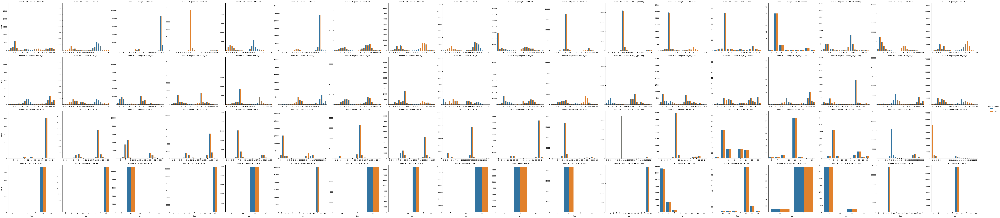

In [154]:
g = sns.catplot(
    df_tag_counts,
    kind='bar',
    x='tag',
    y='count',
    row='round',
    row_order=ROUNDS,
    hue='deduplication',
    col='sample',
    sharex=False,
    sharey='col')

# red color for xticklabels corresponding to tags added during pooling
# for (r, sample), ax in g.axes_dict.items():
#     for text in ax.get_xticklabels():
#         if int(text.get_text()) in rounds_to_pooled_tags[r]:
#             text.set_color('red')
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# g.figure.set_size_inches(25, 18)

# g.figure.savefig(
#     os.path.join(DIR_RESULTS, 'tag_counts_by_sample.pdf'),
#     bbox_inches='tight',
#     dpi=300)

In [155]:
g.figure.savefig(
    os.path.join(DIR_RESULTS, 'tag_counts_by_sample.pdf'),
    bbox_inches='tight')

## Flow diagram

In [156]:
for sample in df_barcode_counts['sample'].unique():
    fig = go.Figure(go.Parcats(
        dimensions=[{'label': r, 'values': df_barcode_counts.loc[df_barcode_counts['sample'] == sample, r]} for r in ROUNDS],
        counts=df_barcode_counts.loc[df_barcode_counts['sample'] == sample, 'count_dedup']))
    fig.update_layout(
        title_text=f'Sample: {sample}',
        width=600,
        height=600,
        margin=dict(l=10, b=10, t=50, r=10)
    )
    fig.show()
    fig.write_image(os.path.join(DIR_RESULTS, f'parcats_{sample}.pdf'))

## (TBD) Ligation of pooled tags

1. (Distribution over samples) For a given round, what proportion of tags were pooled tags?
2. (Distribution over samples) For a given round, what proportion of tags were accounted by each pooled tag?
4. (Distribution over samples) For a given partial (2 out of 3 rounds) barcode, what proportion of the "missing" round is made up of pooled tags?

In [46]:
df_pooled_tags_counts = (
    df_tag_counts
    .groupby(["sample", "round", "deduplication"], group_keys=False)
    .apply(lambda group: (
        group
        .assign(total=group["count"].sum())
        .loc[group["tag"].isin(rounds_to_pooled_tags[group.iloc[0]["round"]])]))
    .pipe(lambda df: df.assign(proportion=df['count']/df['total']))
    .sort_values(['deduplication', 'round', 'sample', 'proportion'])
    .reset_index(drop=True)
)

In [47]:
# assert that the number of counts observed at each round is the same for all samples
assert df_pooled_tags_counts.groupby(['sample', 'deduplication'])['total'].agg(lambda x: len(np.unique(x)) == 1).all()

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



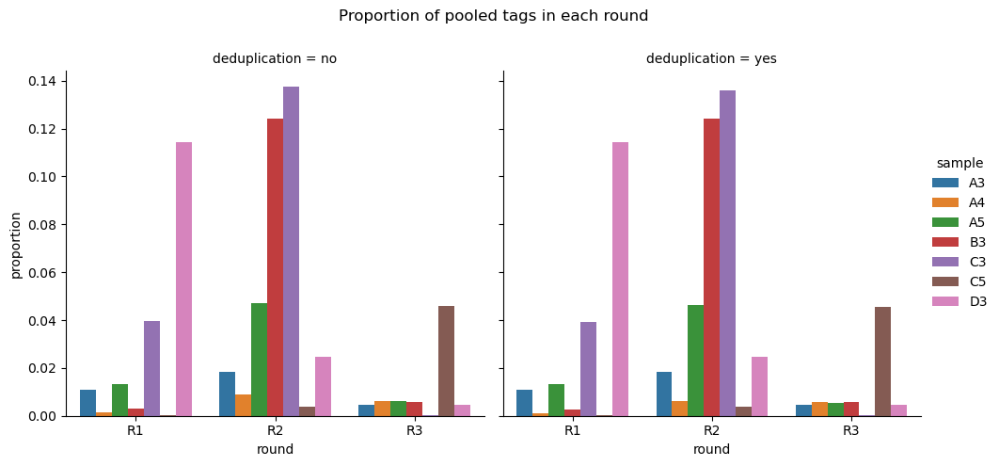

In [48]:
g = sns.catplot(
    df_pooled_tags_counts.groupby(['sample', 'round', 'deduplication'], as_index=False)['proportion'].sum(),
    kind='bar',
    x='round',
    y='proportion',
    hue='sample',
    col='deduplication')
g.figure.subplots_adjust(top=0.85)
g.figure.suptitle('Proportion of pooled tags in each round')
g.figure.show()

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



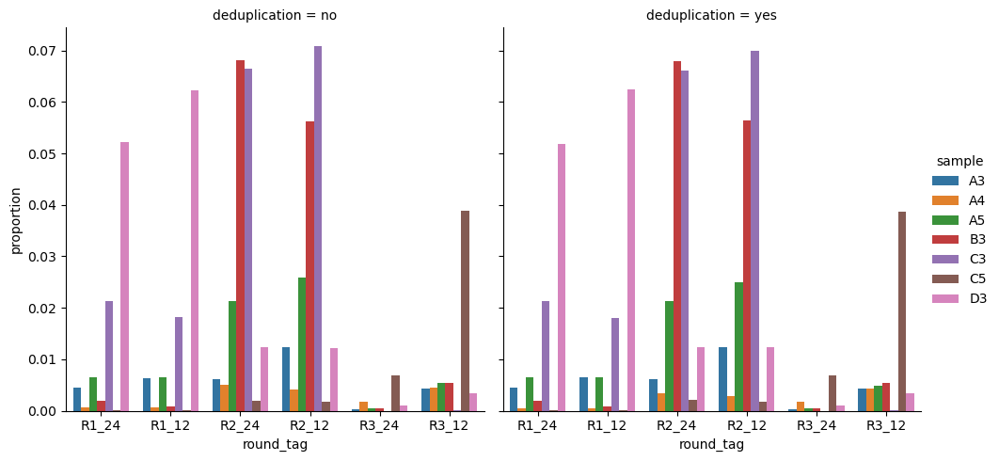

In [49]:
sns.catplot(
    df_pooled_tags_counts.assign(
        round_tag=df_pooled_tags_counts['round'].str.cat(df_pooled_tags_counts['tag'].astype(str), sep='_')),
    kind='bar',
    x='round_tag',
    y='proportion',
    hue='sample',
    col='deduplication')
g.figure.subplots_adjust(top=0.85)
g.figure.suptitle('Proportion of pooled tags in each round')
g.figure.show()

In [50]:
df_pooled_tag_proportion_per_partial_barcode = []
for i in range(len(ROUNDS)):
    partial_rounds = ROUNDS[:i] + ROUNDS[i+1:]
    pooled_round = ROUNDS[i]
    df_pooled_tag_proportion_per_partial_barcode.append((
        df_barcode_counts
        .groupby(['sample'] + partial_rounds, observed=True, as_index=False)
        .apply(lambda group:
               group.loc[group[pooled_round].isin(rounds_to_pooled_tags[pooled_round]), ['count', 'count_dedup']].sum(axis=0) / 
               group[['count', 'count_dedup']].sum(axis=0))
        .assign(**{pooled_round: -1, 'round': pooled_round})
        .rename(columns={'count': 'proportion', 'count_dedup': 'proportion_dedup'})
    ))
df_pooled_tag_proportion_per_partial_barcode = pd.concat(df_pooled_tag_proportion_per_partial_barcode) \
    .astype(dict(round='category'))

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



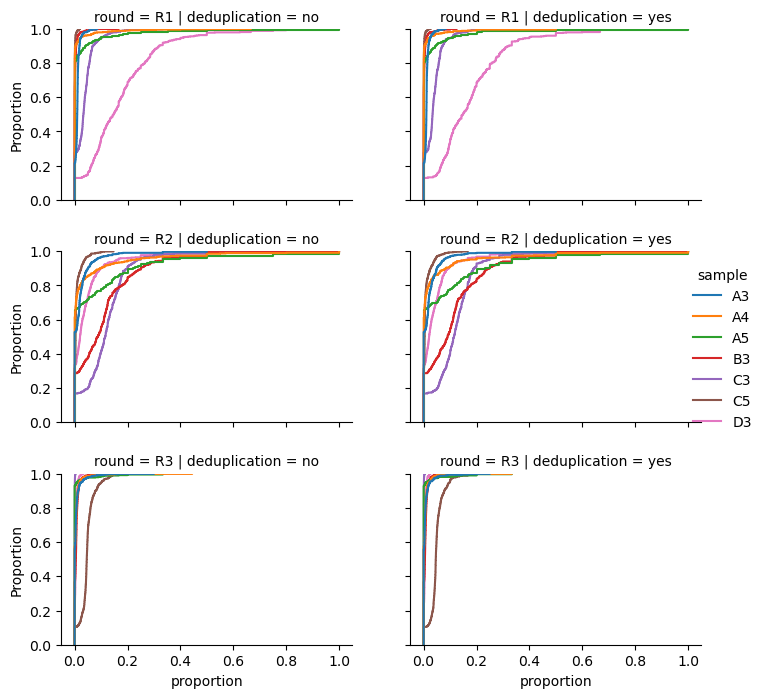

In [51]:
g = sns.displot(
    kind='ecdf',
    data=(
        df_pooled_tag_proportion_per_partial_barcode
        .rename(columns={'proportion': 'no', 'proportion_dedup': 'yes'}) \
        .melt(id_vars=['sample', 'round'],
              value_vars=['no', 'yes'],
              var_name='deduplication',
              value_name='proportion')),
    x='proportion',
    hue='sample',
    row='round',
    row_order=ROUNDS,
    col='deduplication',
    facet_kws={'gridspec_kws': dict(hspace=0.3)})
g.figure.set_size_inches((8, 8))

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



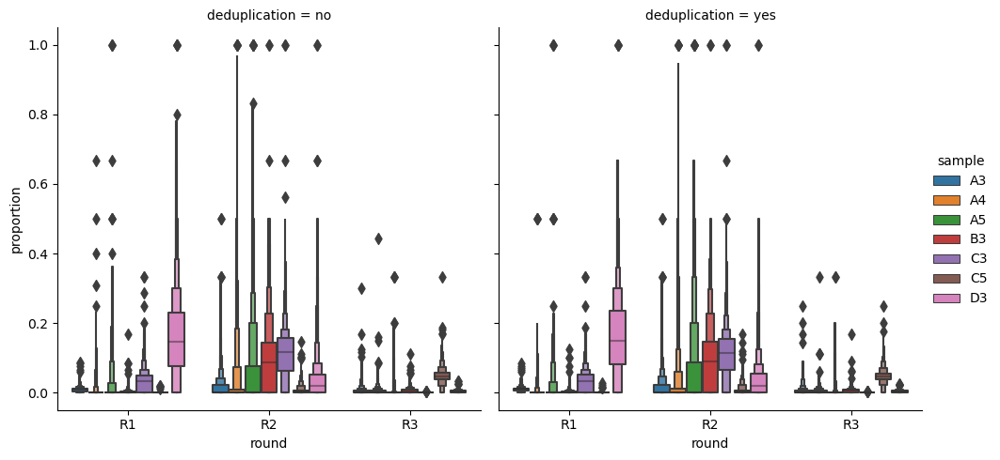

In [52]:
sns.catplot(
    kind='boxen',
    data=df_pooled_tag_proportion_per_partial_barcode \
        .rename(columns={'proportion': 'no', 'proportion_dedup': 'yes'}) \
        .melt(id_vars=['sample', 'round'],
              value_vars=['no', 'yes'],
              var_name='deduplication',
              value_name='proportion'),
    x='round',
    y='proportion',
    hue='sample',
    col='deduplication')

## (TBR) Independence of each round

In [53]:
df_rounds_independence = []
for r1, r2 in itertools.combinations(ROUNDS, 2):
    for sample, group in df_barcode_counts.groupby('sample'):
        pvalue = scipy.stats.chi2_contingency((
            group
            .groupby([r1, r2], observed=True, as_index=False)['count'].sum()
            .pivot(columns=r2, index=r1)
            .fillna(0)
            .values
        )).pvalue
        df_rounds_independence.append(dict(sample=sample, r1=r1, r2=r2, pvalue=pvalue))
df_rounds_independence = pd.DataFrame(df_rounds_independence)

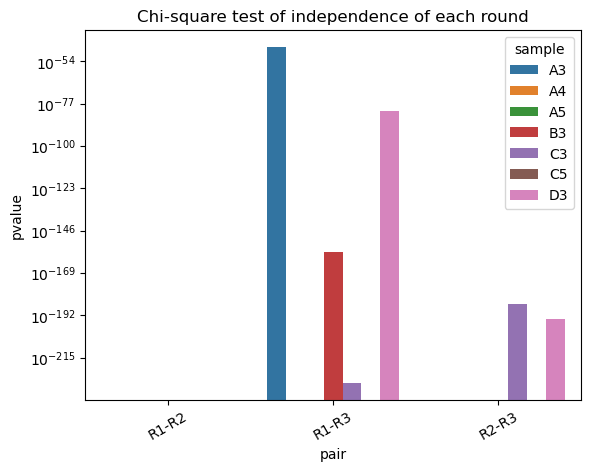

In [54]:
ax = sns.barplot(
    df_rounds_independence.assign(pair=df_rounds_independence['r1'].str.cat(df_rounds_independence['r2'], sep='-')),
    x='pair',
    y='pvalue',
    hue='sample')
ax.set_yscale('log')
ax.tick_params(axis='x', labelrotation=30)
ax.set_title('Chi-square test of independence of each round')
ax.figure.show()

# Analyze barcode count distributions

Structure of `dist_oligos` and `dist_unique_oligos` dictionaries
- key: sample
- value: pandas.Series of barcode counts

In [157]:
dist_oligos = {}
dist_unique_oligos = {}
for sample, sample_data in sample_barcode_counts.items():
    dist_oligos[sample] = pd.Series(sum(barcode_data.values()) for barcode_data in sample_data.values())
    dist_unique_oligos[sample] = pd.Series(map(len, sample_data.values()))

In [158]:
for sample, sample_data in sample_barcode_counts.items():
    print(f'Number of barcodes in sample {sample}:', len(sample_data))
    print('Frequency of most common barcodes:', dist_oligos[sample].sort_values(ascending=False).values[:10])
    print('Frequency of most common barcodes (dedup):', dist_unique_oligos[sample].sort_values(ascending=False).values[:10])
    print()

Number of barcodes in sample EDTA_A2: 611
Frequency of most common barcodes: [176  84  55  50  47  43  42  32  32  29]
Frequency of most common barcodes (dedup): [175  84  55  50  47  43  42  32  32  29]

Number of barcodes in sample EDTA_A3: 2390
Frequency of most common barcodes: [435 400 315 315 289 226 187 182 182 170]
Frequency of most common barcodes (dedup): [433 400 315 315 288 226 187 182 182 170]

Number of barcodes in sample EDTA_B2: 744
Frequency of most common barcodes: [711 541 535 535 490 435 386 356 337 285]
Frequency of most common barcodes (dedup): [709 541 535 535 489 435 386 356 337 285]

Number of barcodes in sample EDTA_C3: 638
Frequency of most common barcodes: [1949 1728  439  368  349  268  267  251  200  197]
Frequency of most common barcodes (dedup): [1948 1726  439  368  349  268  267  250  200  197]

Number of barcodes in sample EDTA_D2: 2162
Frequency of most common barcodes: [1519  812  770  748  624  485  433  407  385  383]
Frequency of most common barc

In [159]:
df_dist_oligos = pd.concat(
    [
        s.rename("count")
        .to_frame()
        .pipe(
            lambda df: df.assign(
                **dict(sample=sample, proportion=df["count"] / df["count"].sum())
            )
            .sort_values("count", ascending=False)
            .assign(barcode_rank=range(1, len(df) + 1))
        )
        for sample, s in dist_oligos.items()
    ],
    axis=0,
).astype(dict(sample="category"))


df_dist_unique_oligos = pd.concat(
    [
        s.rename("count")
        .to_frame()
        .pipe(
            lambda df: df.assign(
                **dict(sample=sample, proportion=df["count"] / df["count"].sum())
            )
            .sort_values("count", ascending=False)
            .assign(barcode_rank=range(1, len(df) + 1))
        )
        for sample, s in dist_unique_oligos.items()
    ],
    axis=0,
).astype(dict(sample="category"))

### Count (or proportion of total count) per barcode (akin to scSPRITE Figure 1C)

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



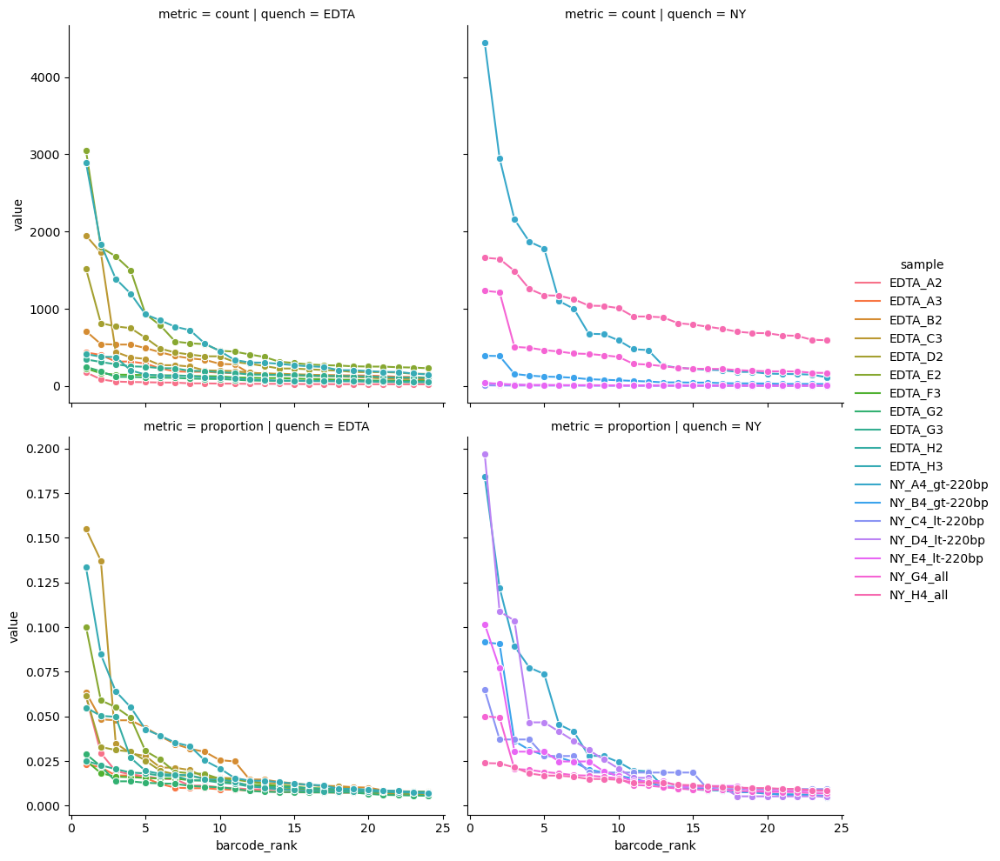

In [171]:
g = sns.relplot(
    kind='line',
    data=(
        df_dist_unique_oligos
        .assign(quench=df_dist_unique_oligos['sample'].str.extract('^([^_]+)'))
        .loc[df_dist_unique_oligos['barcode_rank'] < 25]
        .melt(id_vars=['sample', 'barcode_rank', 'quench'], var_name='metric')
    ),
    x='barcode_rank',
    y='value',
    hue='sample',
    col='quench',
    row='metric',
    marker='o',
    facet_kws=dict(sharey='row')
)

g.figure.savefig(
    os.path.join(DIR_RESULTS, 'barcode_count_by_barcode_rank.png'),
    dpi=300,
    bbox_inches='tight')